In [1]:
import SimDAT2D.SimDAT2D_MDK as sim
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import IsoDAT2D.IsoDAT2D_MDK as iso
from PIL import Image
import pyFAI, fabio
from pyFAI.gui import jupyter
import pyFAI
import os
import matplotlib.pyplot as plt
from tifffile import imread
from SimDAT2D import masking
import pyFAI.azimuthalIntegrator as AI
from scipy.ndimage import shift
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score, calinski_harabasz_score

Select calibrant:
1. AgBh
2. Al
3. alpha_Al2O3
4. Au
5. C14H30O
6. CeO2
7. Cr2O3
8. cristobaltite
9. CrOx
10. CuO
11. hydrocerussite
12. LaB6
13. LaB6_SRM660a
14. LaB6_SRM660b
15. LaB6_SRM660c
16. mock
17. NaCl
18. Ni
19. PBBA
20. Pt
21. quartz
22. Si
23. Si_SRM640
24. Si_SRM640a
25. Si_SRM640b
26. Si_SRM640c
27. Si_SRM640d
28. Si_SRM640e
29. TiO2
30. ZnO
Ni


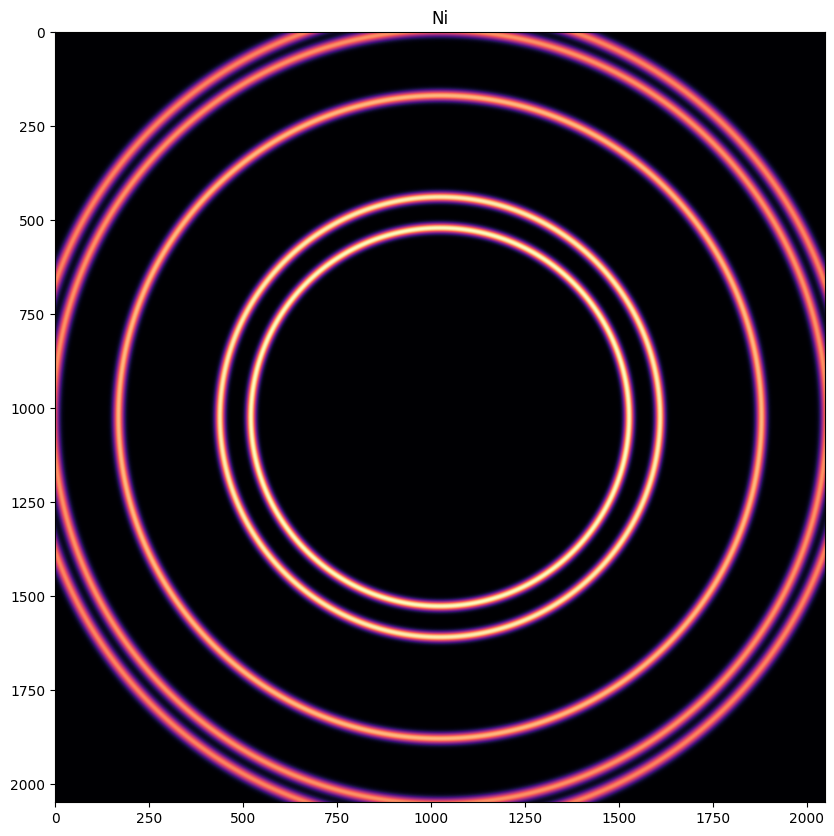

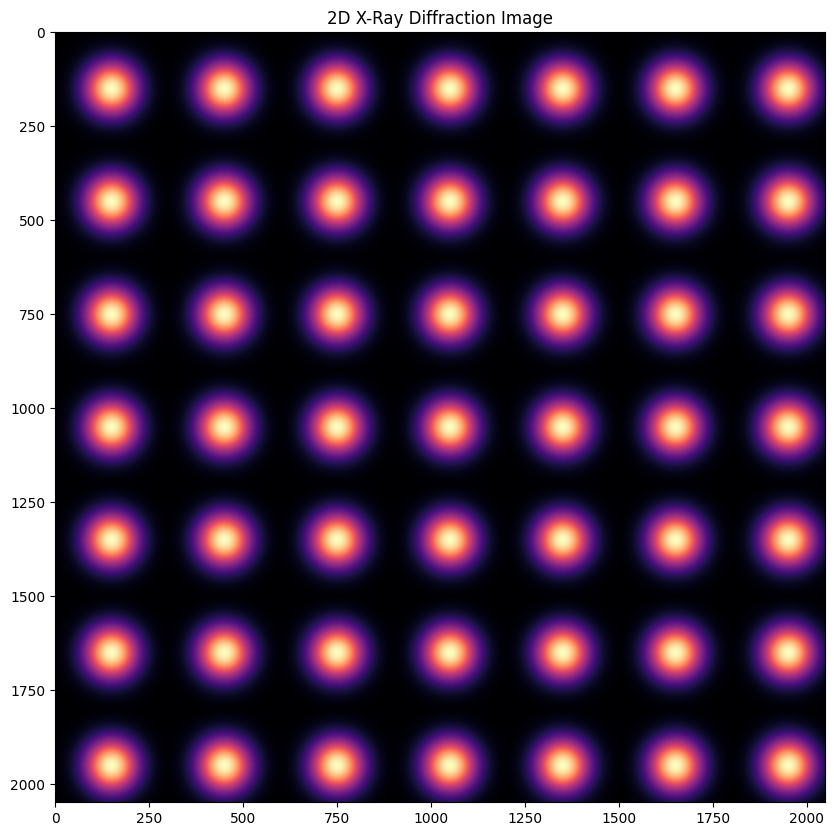

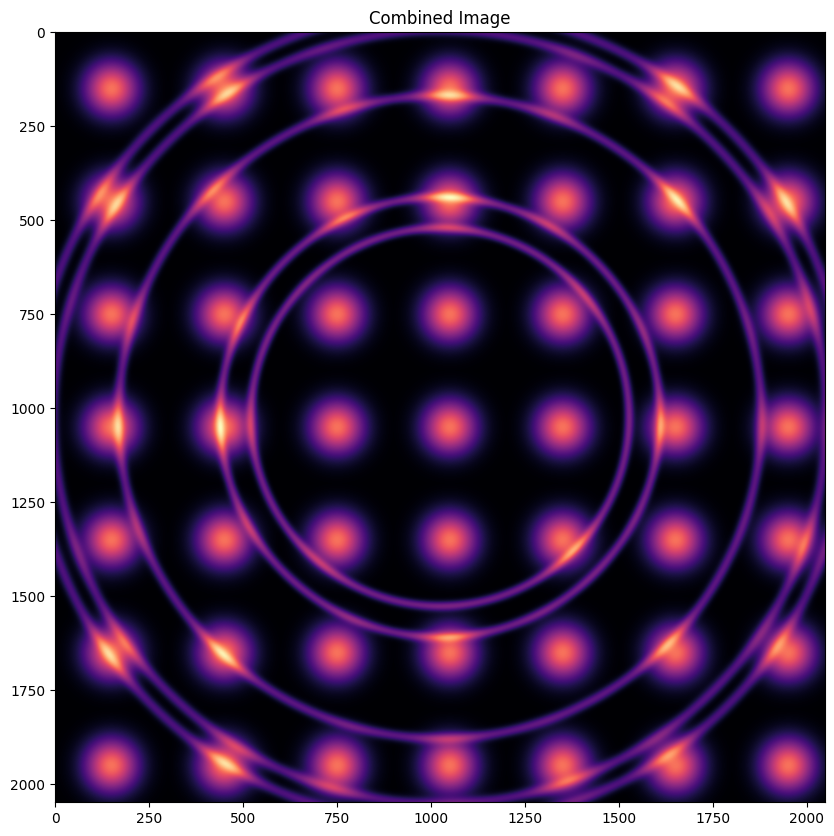

In [2]:
#For ring creation
isotropic_signal = sim.create_isotropic(.4, .5e-10, cmap = 'magma')
#For spot creation
anisotropic_signal = sim.create_anisotropic(25, 50, 300, 300, cmap = 'magma')
#combining signals 
thin_film = sim.combine_image(isotropic_signal, anisotropic_signal*2, cmap= 'magma')

Combined image range: 0.0002468196081733591 to 2.8363407449844638


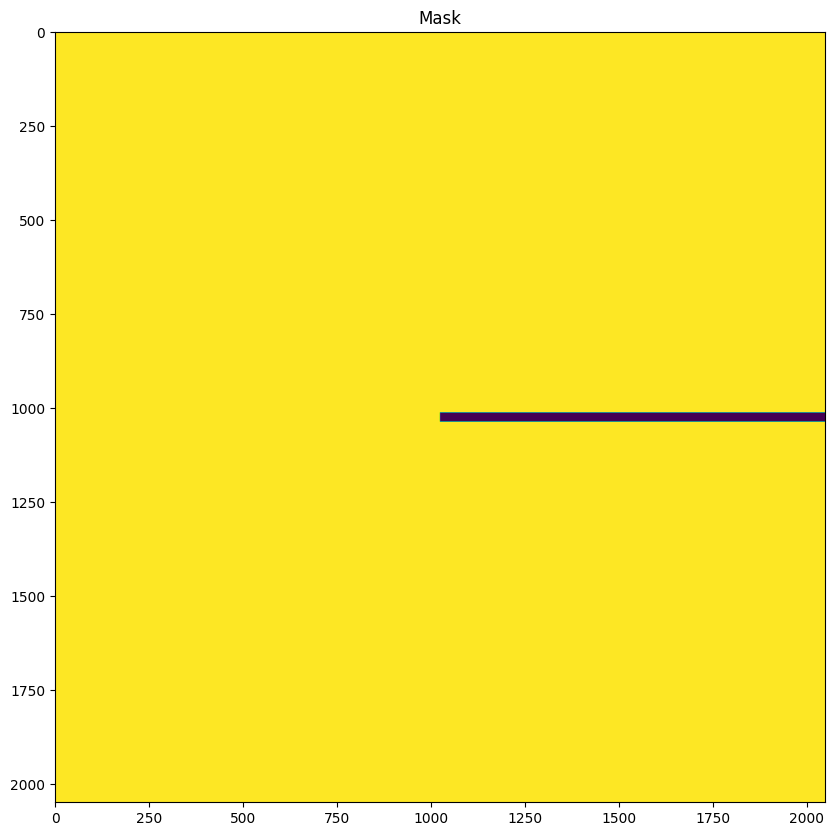

In [3]:
array, ai_pe = masking.make_chi_array(thin_film, .4, .5e-10)

print("Combined image range:", np.min(thin_film), "to", np.max(thin_film))

mask12 = sim.create_mask(thin_film, 12)


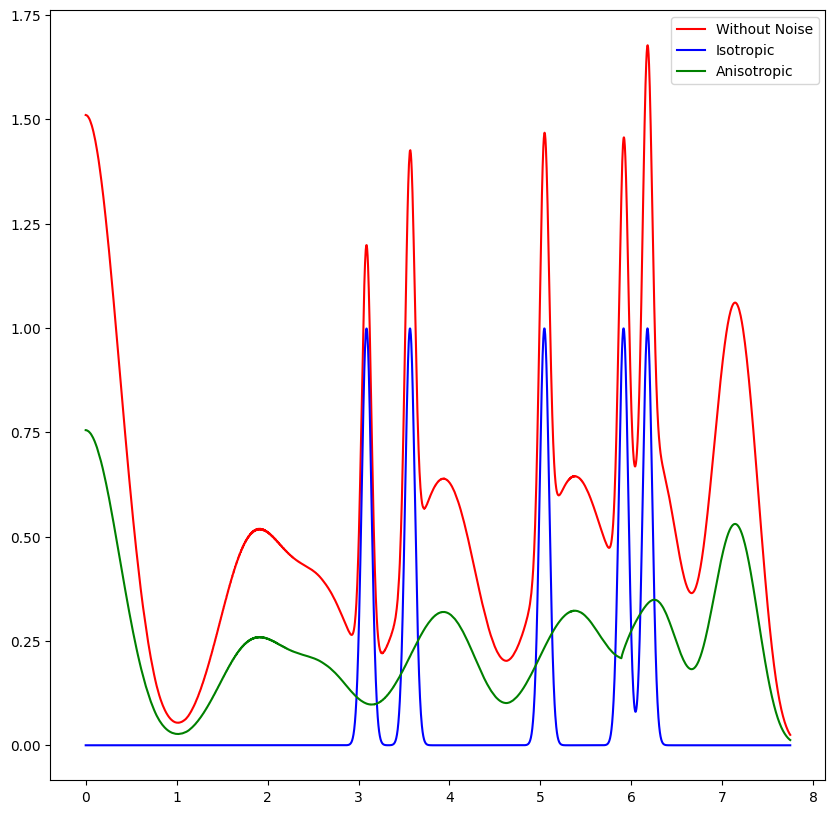

In [4]:

#using simdat2d to integrate the image
# q_noisy, noisy_integrated_im = sim.integrate_image(noisy_im, .4, .5e-10, resolution = 3000)
q, integrated_im = sim.integrate_image(thin_film, .4, .5e-10, resolution = 3000)
q_reg, integrated_reg = sim.integrate_image(isotropic_signal, .4, .5e-10, resolution = 3000)
q_aniso, integrated_aniso = sim.integrate_image(anisotropic_signal, .4, .5e-10, resolution = 3000)

# plot
plt.figure(figsize = (10,10))
# plt.plot(q_noisy, noisy_integrated_im, c= 'k', label = 'With Noise')
plt.plot(q, integrated_im, c= 'r', label = 'Without Noise')
plt.plot(q_reg, integrated_reg, c= 'b', label = 'Isotropic')
plt.plot(q_aniso, integrated_aniso, c= 'g', label = 'Anisotropic')
plt.plot()
plt.legend()

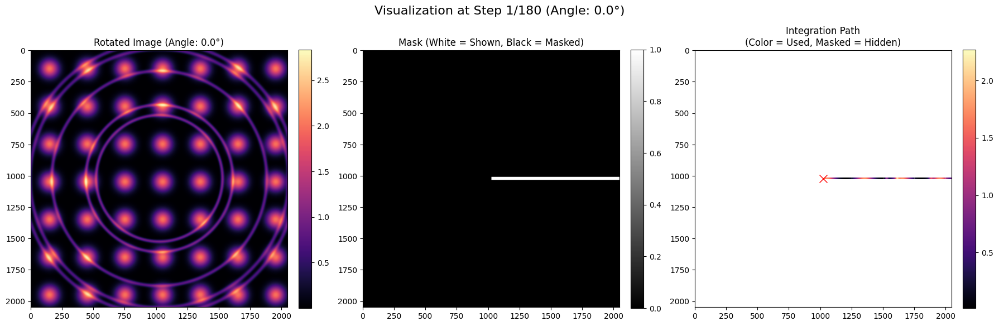

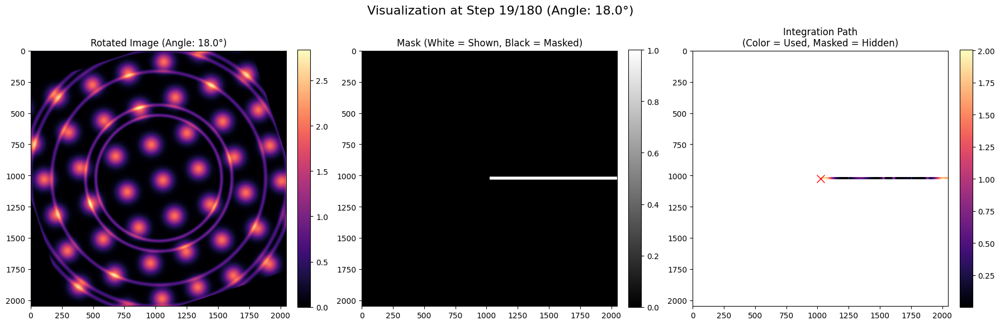

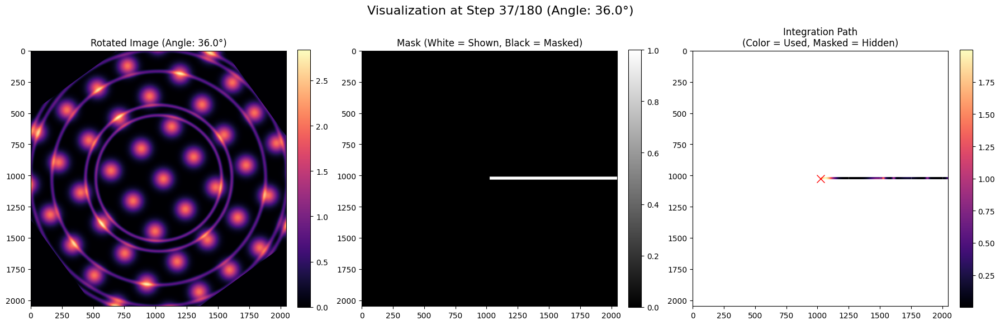

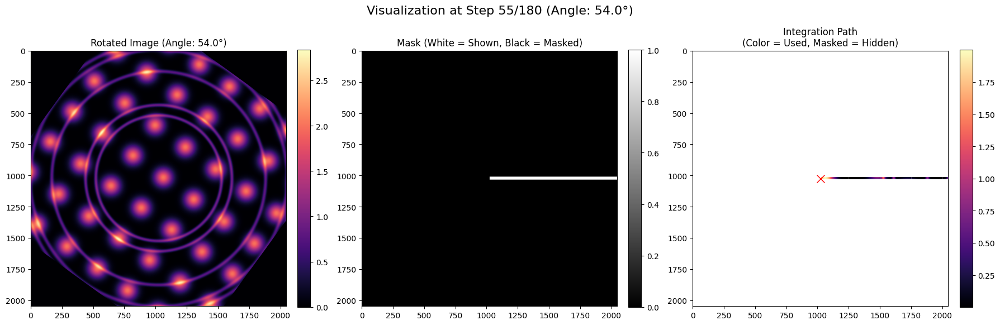

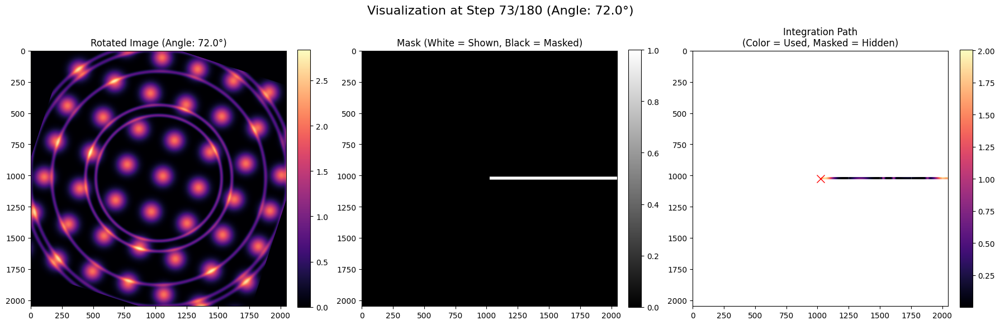

...

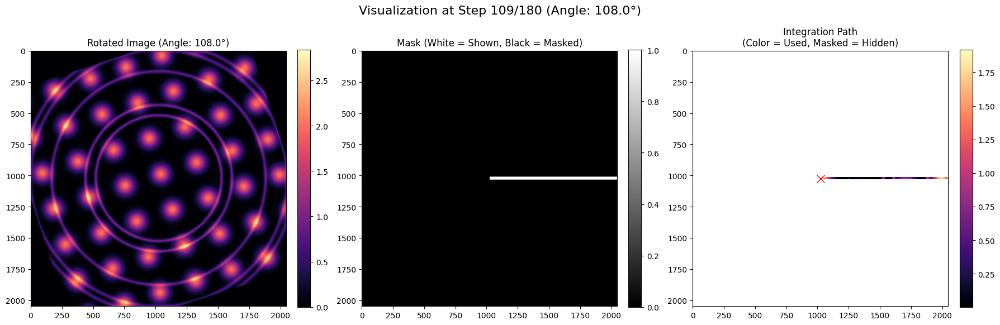

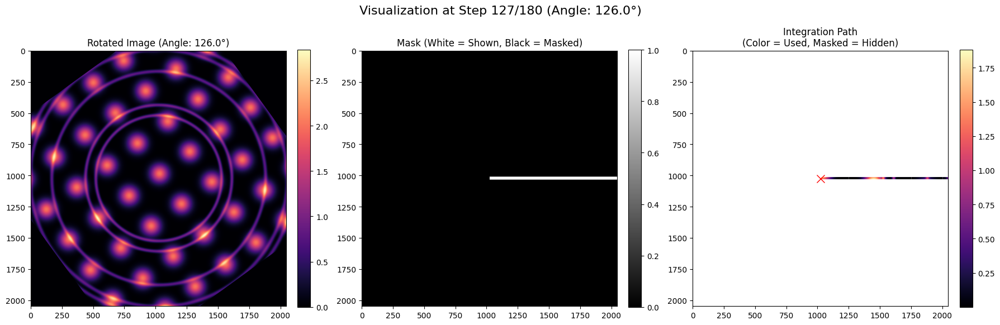

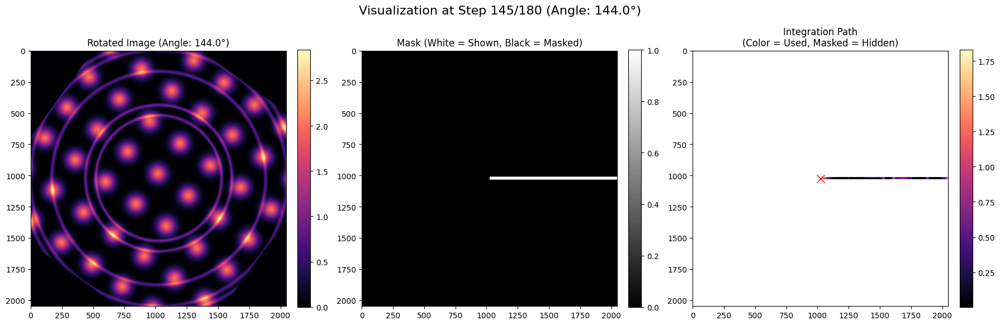

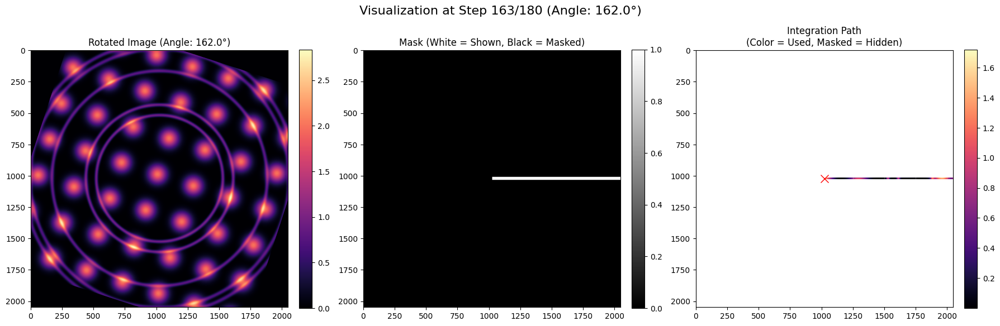

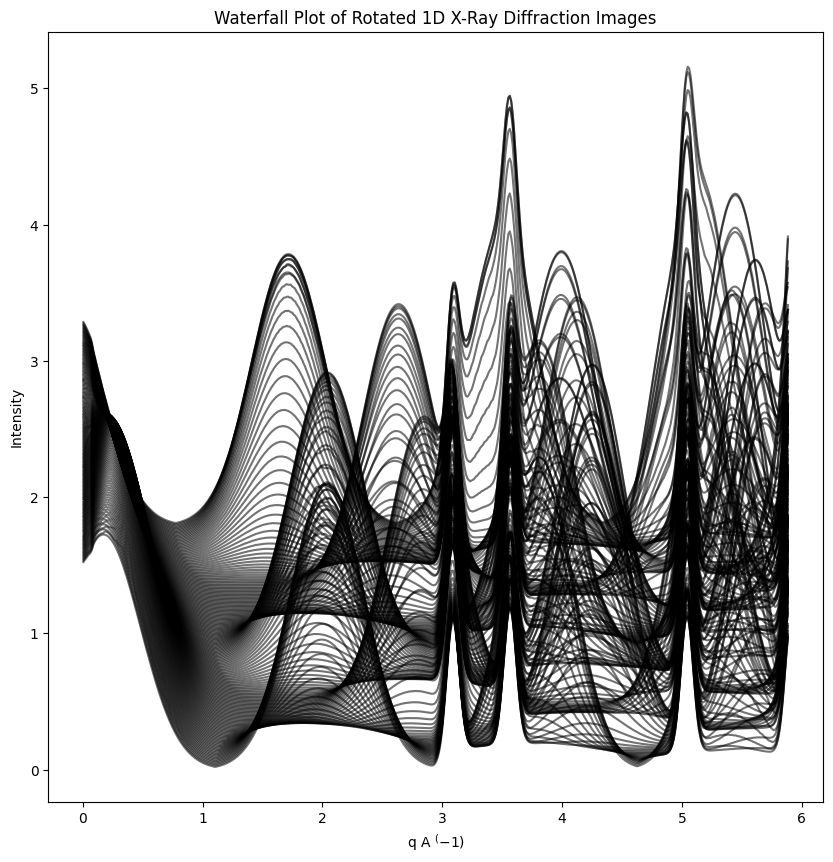

In [5]:
q, rotated_data = sim.rotate_and_integrate_printout(thin_film, 1, .4, .5e-10, resolution = 500, mask = mask12)

In [6]:
def run_sklearn_nmf_with_labeling(data, max_components, max_iter=600, init='random', 
                                solver='cd', tol=1e-4, patience=5, n_clusters=5, 
                                cluster_matrix='W'):
    """
    Run NMF with labeling step before clustering.
    """
    # Run NMF
    W, H, reconstruction_err = iso.run_sklearn_nmf(data, max_components, max_iter, 
                                                 init, solver, tol, patience)
    
    # Label components
    labeled_components = label_nmf_components(W, H)
    
    # Prepare data for clustering
    if cluster_matrix == 'W':
        clustering_data = W.T  # Transpose to cluster components
    else:
        clustering_data = H  # Already in correct shape
    
    # Perform clustering using AgglomerativeClustering directly
    clustering = iso.AgglomerativeClustering(n_clusters=n_clusters)
    clusters = clustering.fit_predict(clustering_data)
    
    # Add cluster assignments
    for i, (label, component) in enumerate(labeled_components.items()):
        component['cluster'] = clusters[i]
        
    return labeled_components, clusters

def label_nmf_components(W_matrix, H_matrix, labels=None):
    """
    Label NMF components with visualization aids.
    """
    labeled_components = {}
    
    if labels is None:
        labels = []
        for i in range(W_matrix.shape[1]):
            # Plot component
            plt.figure(figsize=(12, 6))
            
            # Plot basis vector
            plt.subplot(1, 2, 1)
            plt.plot(W_matrix[:, i])
            plt.title(f'Basis Vector {i+1}')
            plt.xlabel('Data Points')
            plt.ylabel('Intensity')
            
            # Plot coefficient distribution
            plt.subplot(1, 2, 2)
            plt.hist(H_matrix[i, :], bins=30)
            plt.title(f'Coefficient Distribution {i+1}')
            plt.xlabel('Coefficient Value')
            plt.ylabel('Count')
            
            plt.tight_layout()
            plt.show()
            
            # Suggest label based on characteristics
            print(f"\nComponent {i+1} characteristics:")
            print(f"Max intensity: {np.max(W_matrix[:, i]):.3f}")
            print(f"Mean coefficient: {np.mean(H_matrix[i, :]):.3f}")
            print(f"Coefficient variance: {np.var(H_matrix[i, :]):.3f}")
            
            label = input(f"Enter label for Component {i+1}: ")
            labels.append(label)
    
    # Store components with their labels
    for i, label in enumerate(labels):
        labeled_components[label] = {
            'basis': W_matrix[:, i],
            'coefficients': H_matrix[i, :],
            'statistics': {
                'max_intensity': np.max(W_matrix[:, i]),
                'mean_coef': np.mean(H_matrix[i, :]),
                'var_coef': np.var(H_matrix[i, :])
            }
        }
    
    return labeled_components

Starting NMF algorithm with the following parameters:

Max components: 8
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: random, solver: mu, tol: 0.0001
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed


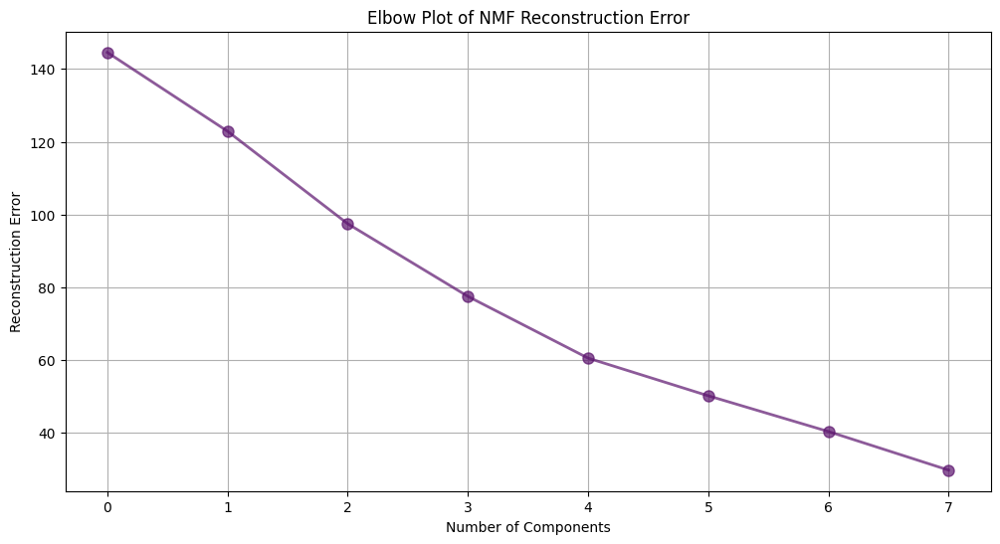

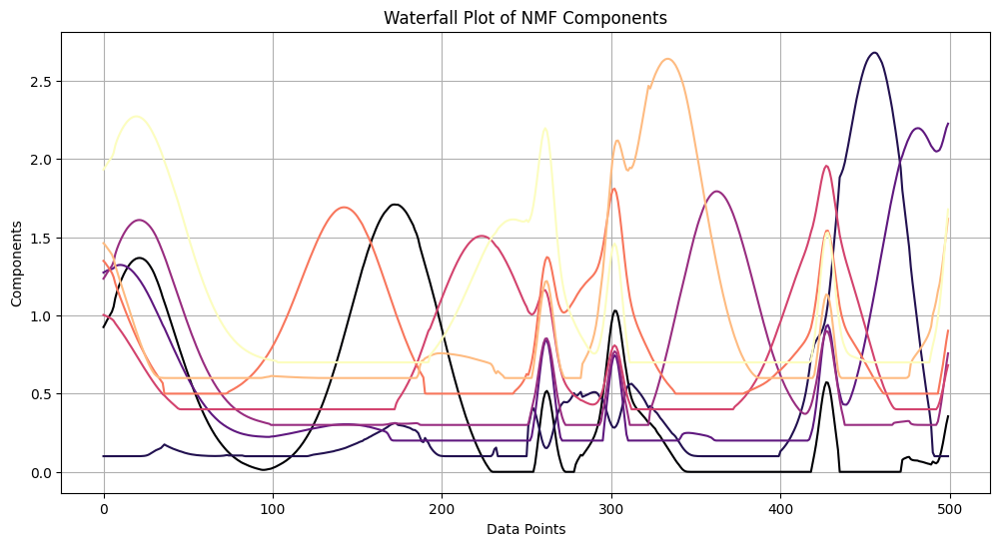

The best number of components is 8


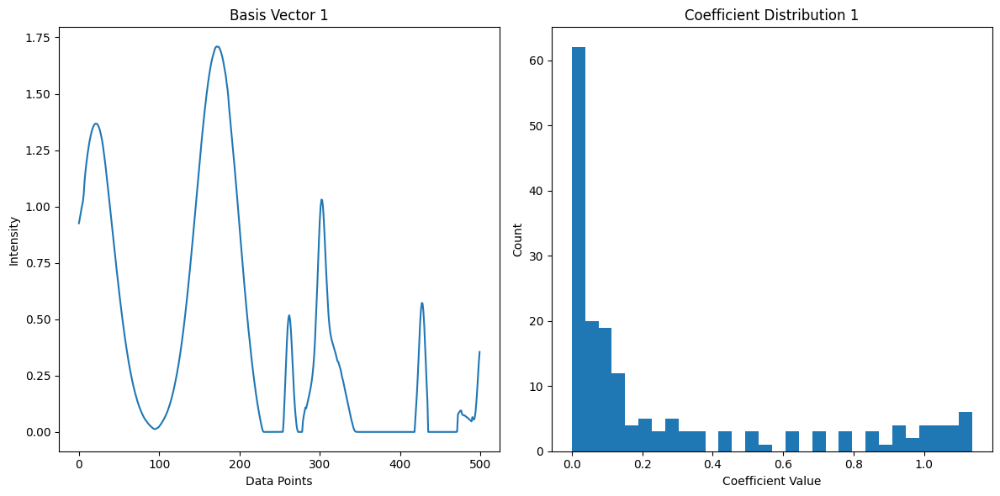


Component 1 characteristics:
Max intensity: 1.710
Mean coefficient: 0.272
Coefficient variance: 0.134


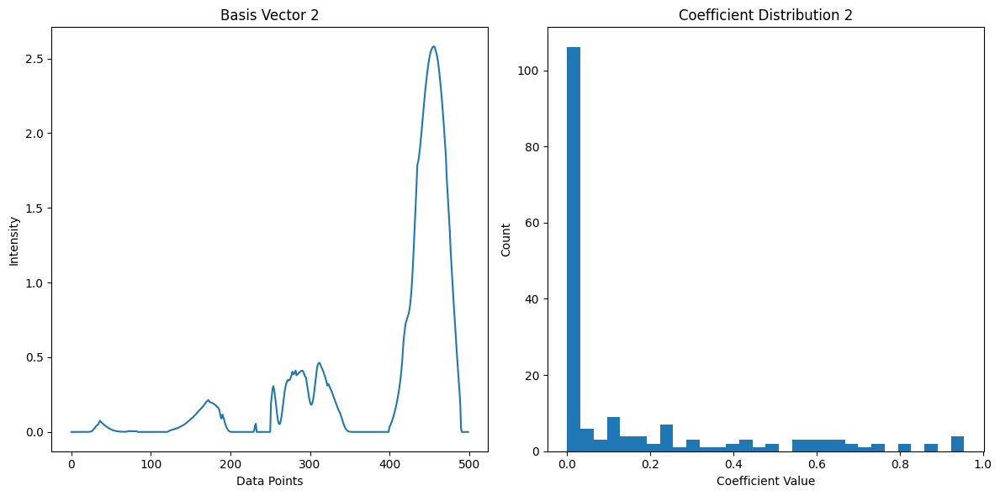


Component 2 characteristics:
Max intensity: 2.581
Mean coefficient: 0.159
Coefficient variance: 0.066


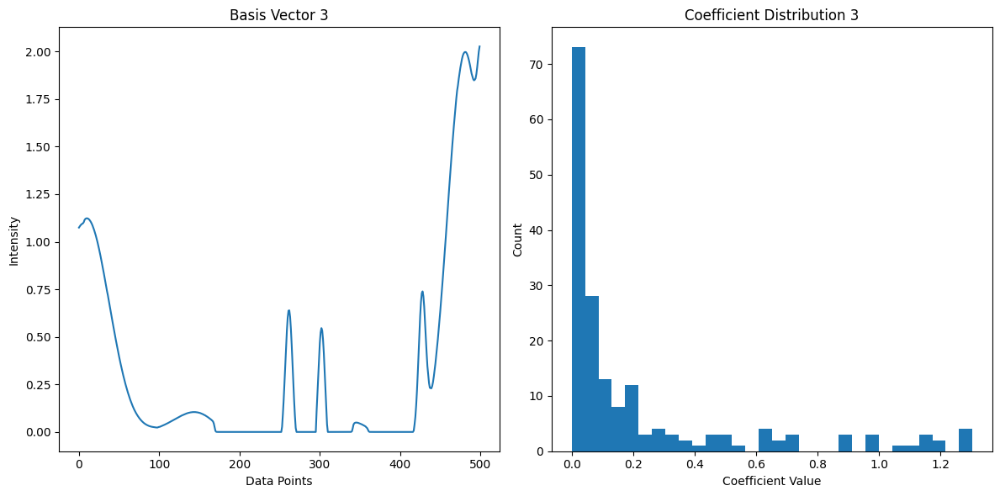


Component 3 characteristics:
Max intensity: 2.027
Mean coefficient: 0.218
Coefficient variance: 0.113


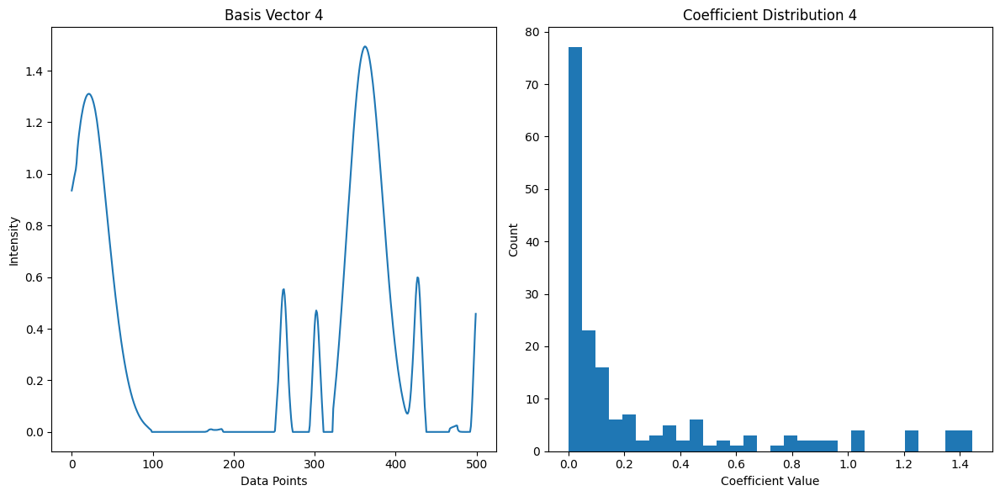


Component 4 characteristics:
Max intensity: 1.494
Mean coefficient: 0.256
Coefficient variance: 0.153


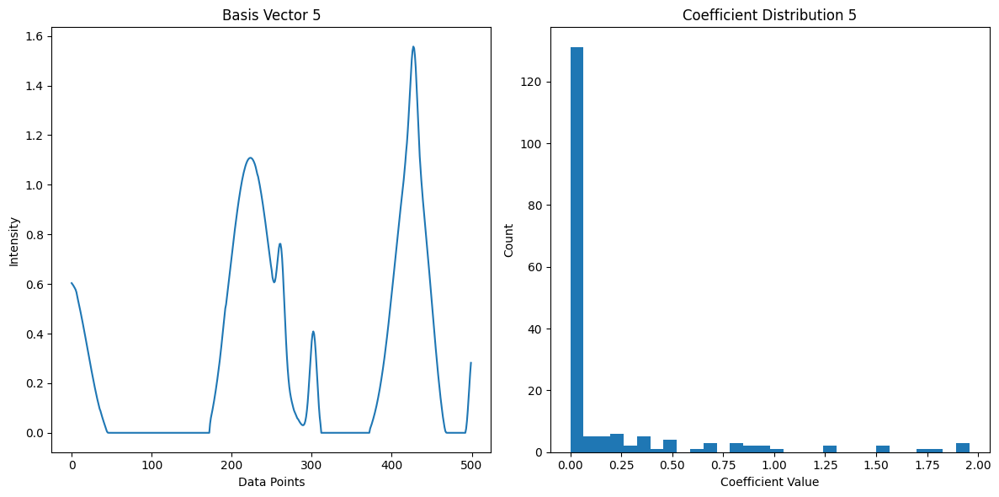


Component 5 characteristics:
Max intensity: 1.557
Mean coefficient: 0.181
Coefficient variance: 0.167


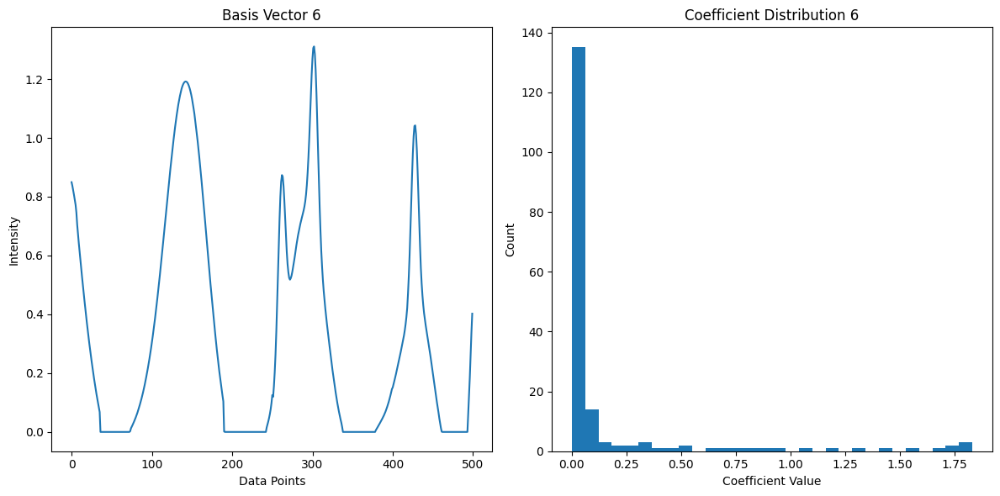


Component 6 characteristics:
Max intensity: 1.311
Mean coefficient: 0.160
Coefficient variance: 0.158


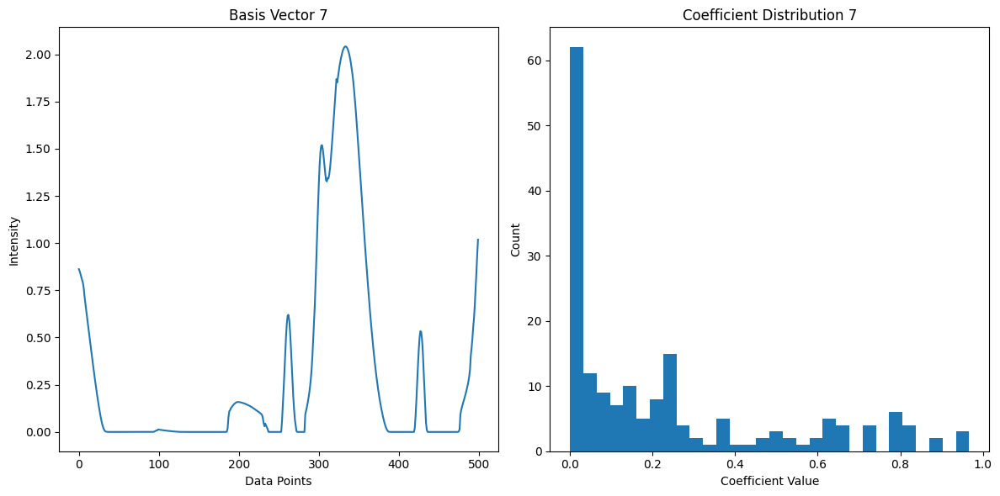


Component 7 characteristics:
Max intensity: 2.041
Mean coefficient: 0.229
Coefficient variance: 0.074


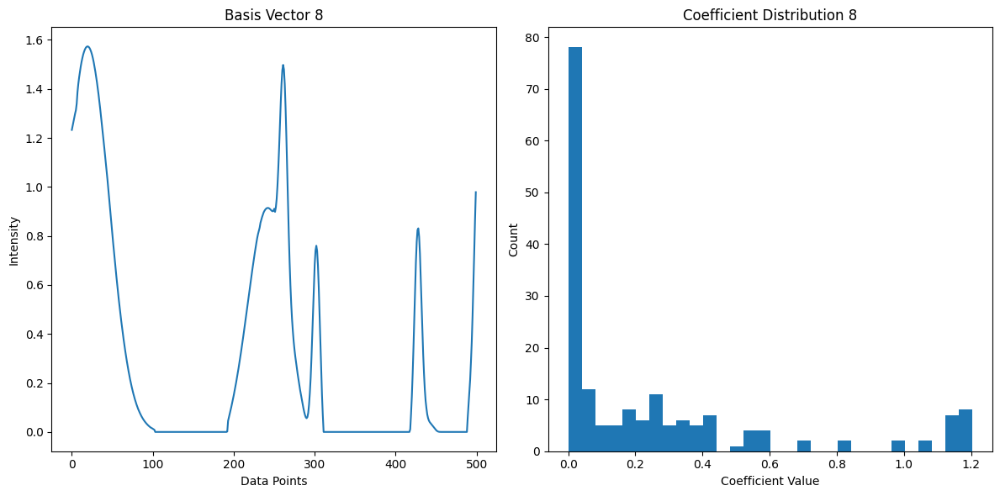


Component 8 characteristics:
Max intensity: 1.573
Mean coefficient: 0.255
Coefficient variance: 0.125
Label: a
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: b
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 1
Label: c
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 1
Label: d
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 2
Label: e
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: f
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: g
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 2
Label: h
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0


In [7]:
# Example usage
data = np.array(rotated_data)  # Your input data
max_components = 8
n_clusters = 3

# Run the modified workflow
labeled_components, clusters = run_sklearn_nmf_with_labeling(
    data=data,
    max_components=max_components,
    n_clusters=n_clusters
)

# Access labeled components
for label, component in labeled_components.items():
    print(f"Label: {label}")
    print(f"Basis shape: {component['basis'].shape}")
    print(f"Coefficients shape: {component['coefficients'].shape}")
    print(f"Cluster: {component['cluster']}")

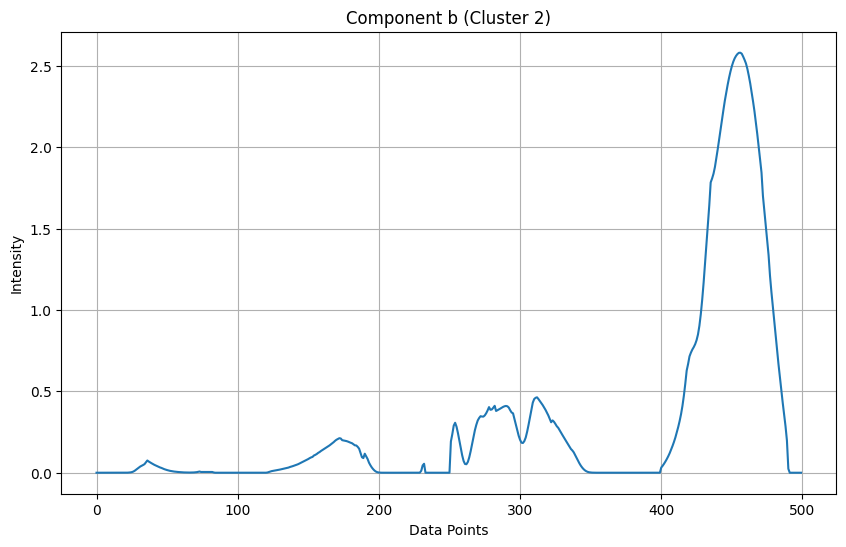

Component b characteristics:
Cluster: 1
Max intensity: 2.581
Mean coefficient: 0.159
Coefficient variance: 0.066


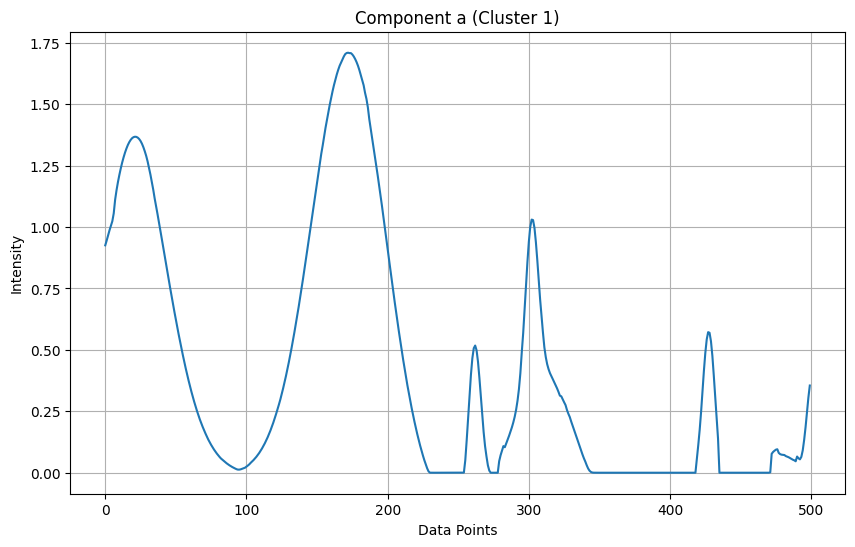

Component a characteristics:
Cluster: 0
Max intensity: 1.710
Mean coefficient: 0.272
Coefficient variance: 0.134


In [8]:
# To print/plot the basis vector of component d
plt.figure(figsize=(10, 6))
plt.plot(labeled_components['b']['basis'])
plt.title('Component b (Cluster 2)')
plt.xlabel('Data Points')
plt.ylabel('Intensity')
plt.grid(True)
plt.show()

# To print its characteristics
print("Component b characteristics:")
print(f"Cluster: {labeled_components['b']['cluster']}")
print(f"Max intensity: {np.max(labeled_components['b']['basis']):.3f}")
print(f"Mean coefficient: {np.mean(labeled_components['b']['coefficients']):.3f}")
print(f"Coefficient variance: {np.var(labeled_components['b']['coefficients']):.3f}")

# To print/plot the basis vector of component d
plt.figure(figsize=(10, 6))
plt.plot(labeled_components['a']['basis'])
plt.title('Component a (Cluster 1)')
plt.xlabel('Data Points')
plt.ylabel('Intensity')
plt.grid(True)
plt.show()

# To print its characteristics
print("Component a characteristics:")
print(f"Cluster: {labeled_components['a']['cluster']}")
print(f"Max intensity: {np.max(labeled_components['a']['basis']):.3f}")
print(f"Mean coefficient: {np.mean(labeled_components['a']['coefficients']):.3f}")
print(f"Coefficient variance: {np.var(labeled_components['a']['coefficients']):.3f}")


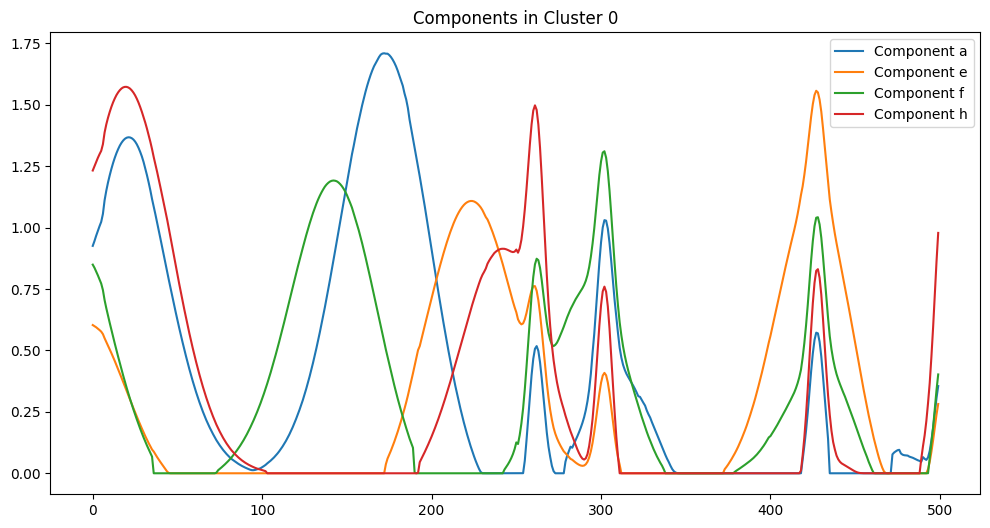

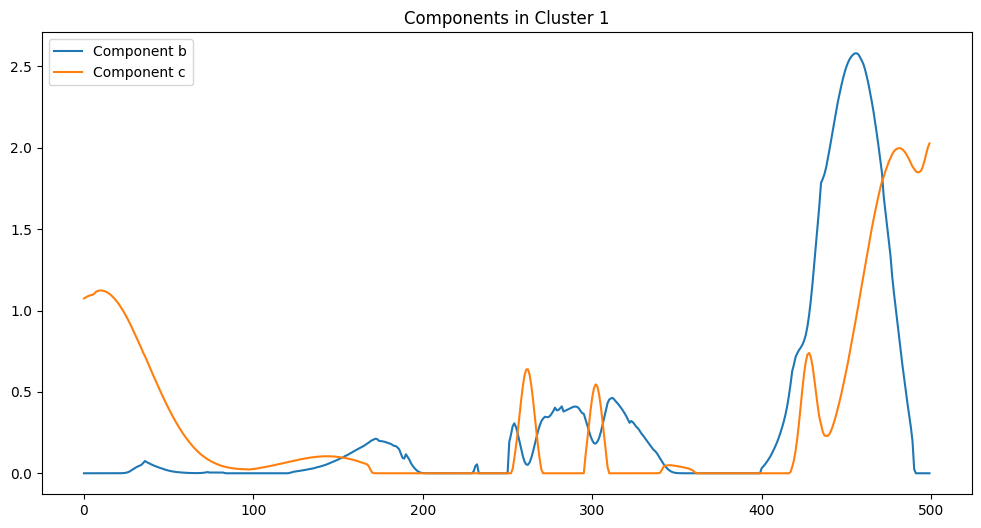

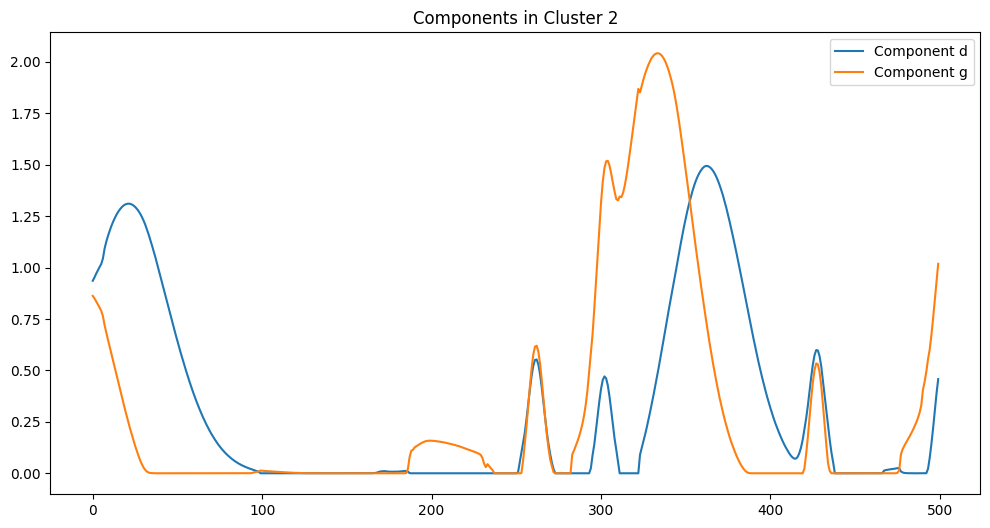

In [9]:
def visualize_components_by_cluster(labeled_components):
    # Group components by cluster
    clusters = {}
    for label, comp in labeled_components.items():
        cluster = comp['cluster']
        if cluster not in clusters:
            clusters[cluster] = []
        clusters[cluster].append((label, comp))
    
    # Plot components within each cluster
    for cluster, comps in clusters.items():
        plt.figure(figsize=(12, 6))
        plt.title(f'Components in Cluster {cluster}')
        for label, comp in comps:
            plt.plot(comp['basis'], label=f'Component {label}')
        plt.legend()
        plt.show()
visualize_components_by_cluster(labeled_components)

Starting NMF algorithm with the following parameters:

Max components: 8
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvda, solver: mu, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed


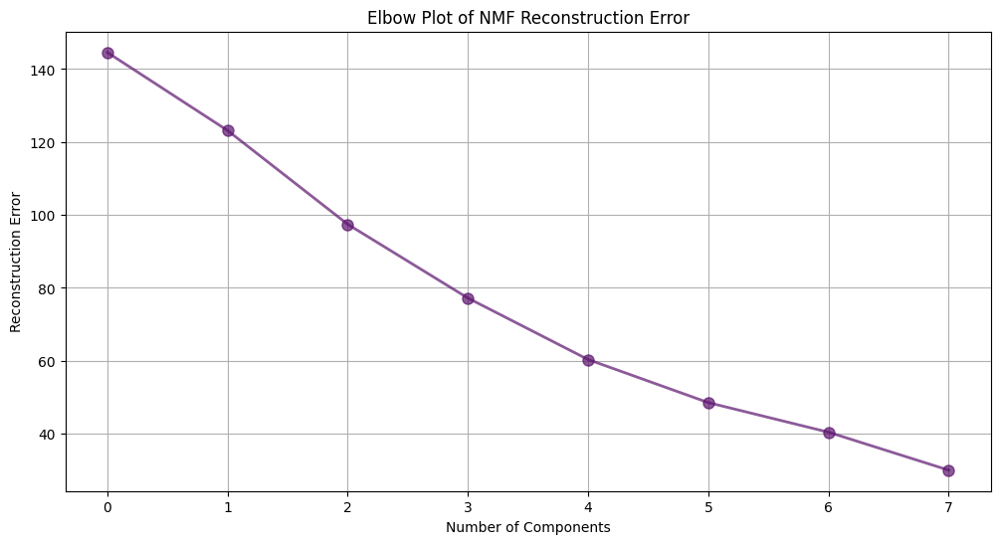

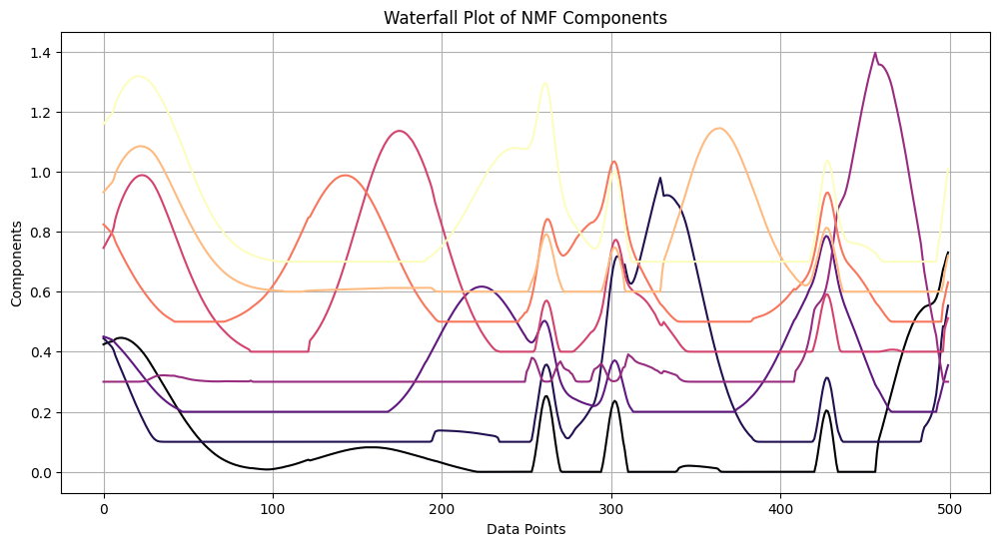

The best number of components is 8


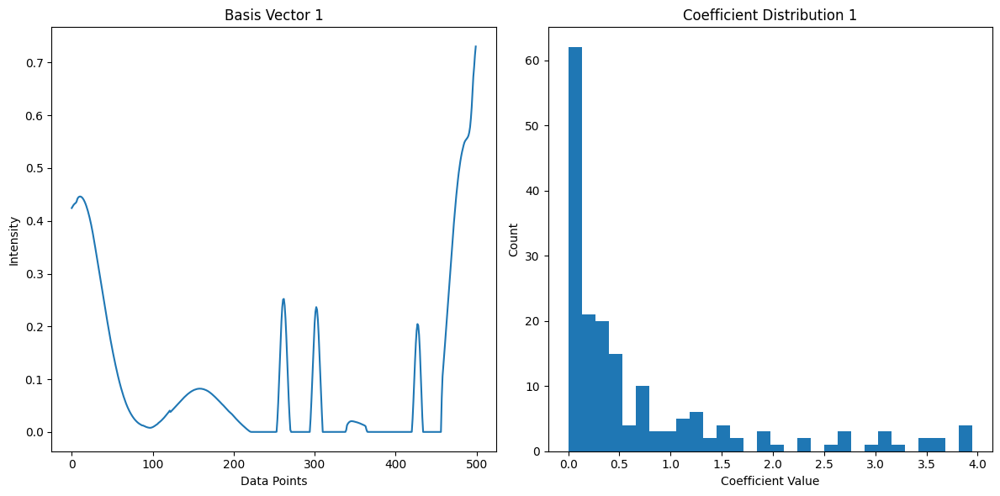


Component 1 characteristics:
Max intensity: 0.731
Mean coefficient: 0.711
Coefficient variance: 0.972


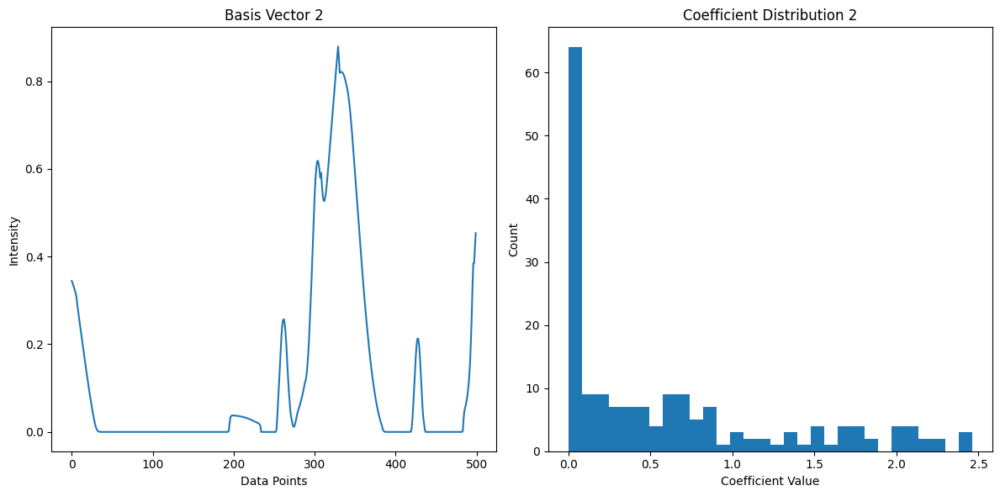


Component 2 characteristics:
Max intensity: 0.879
Mean coefficient: 0.601
Coefficient variance: 0.486


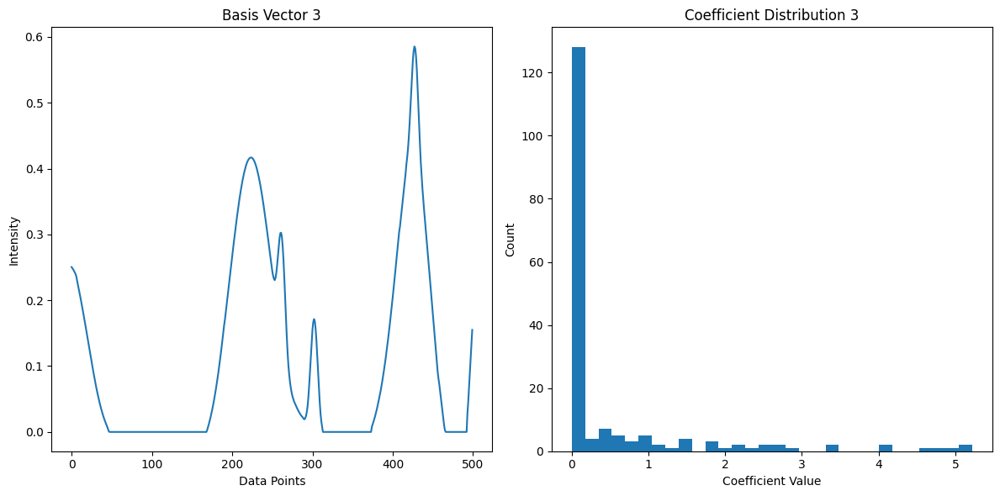


Component 3 characteristics:
Max intensity: 0.586
Mean coefficient: 0.516
Coefficient variance: 1.214


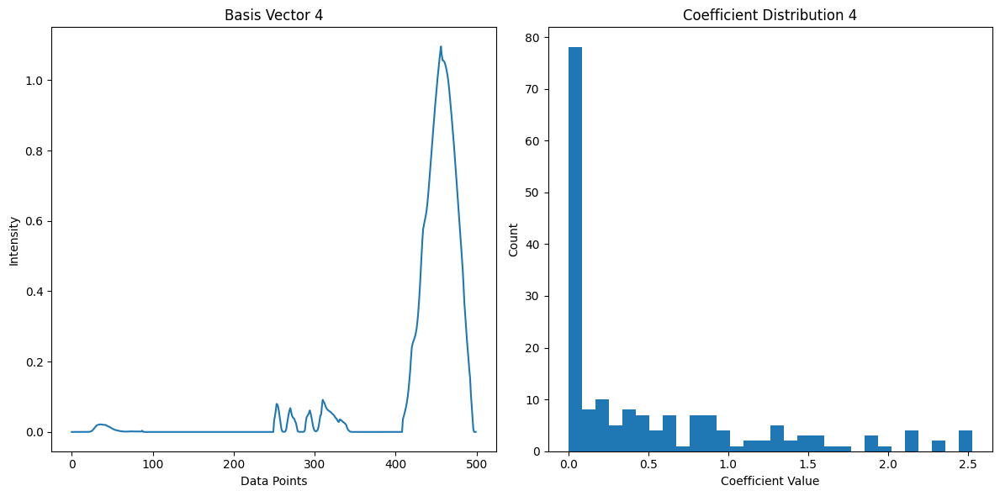


Component 4 characteristics:
Max intensity: 1.096
Mean coefficient: 0.513
Coefficient variance: 0.456


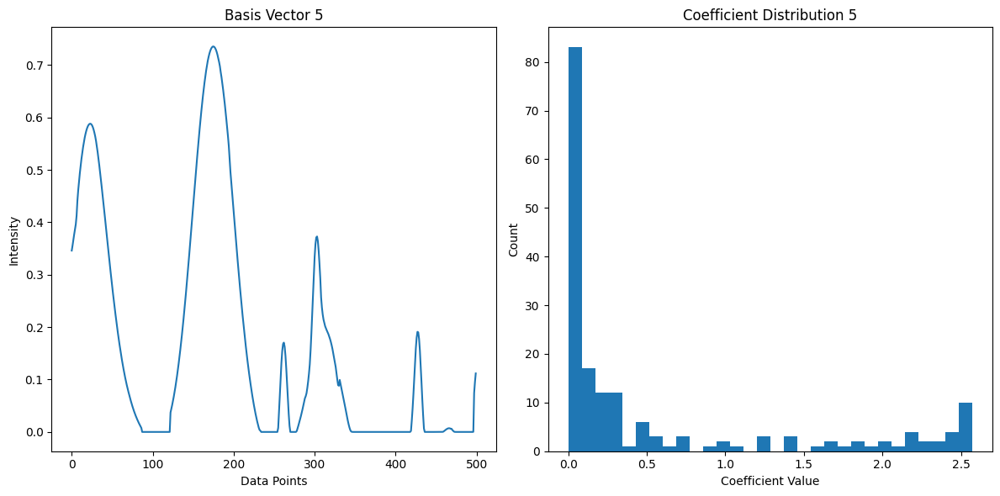


Component 5 characteristics:
Max intensity: 0.735
Mean coefficient: 0.556
Coefficient variance: 0.711


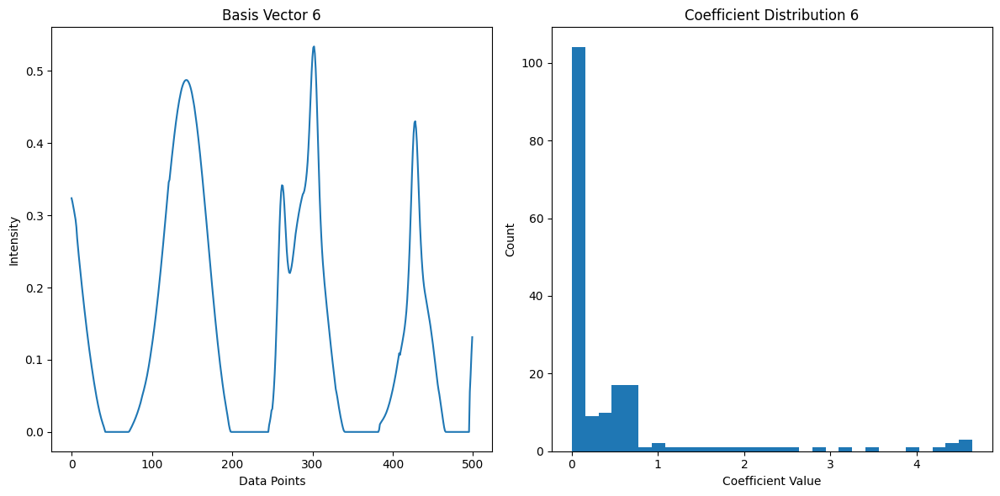


Component 6 characteristics:
Max intensity: 0.534
Mean coefficient: 0.496
Coefficient variance: 0.983


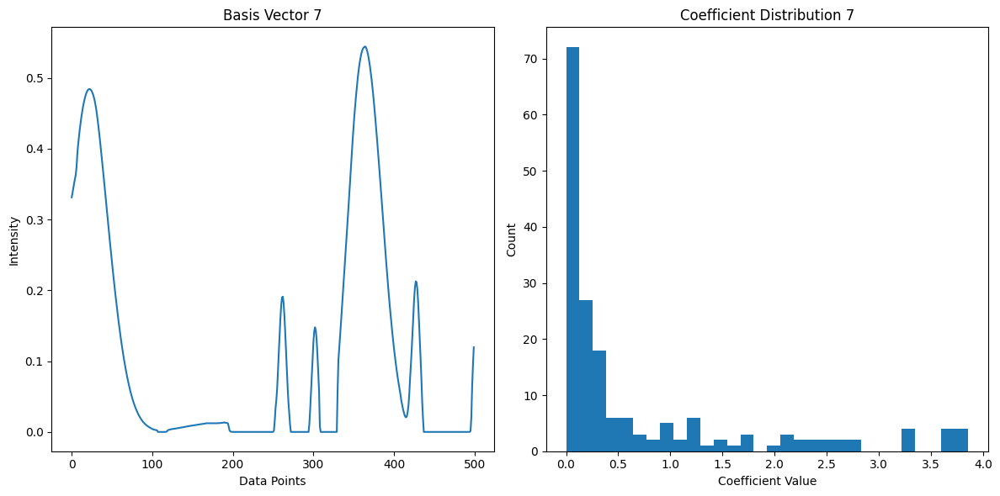


Component 7 characteristics:
Max intensity: 0.544
Mean coefficient: 0.684
Coefficient variance: 1.086


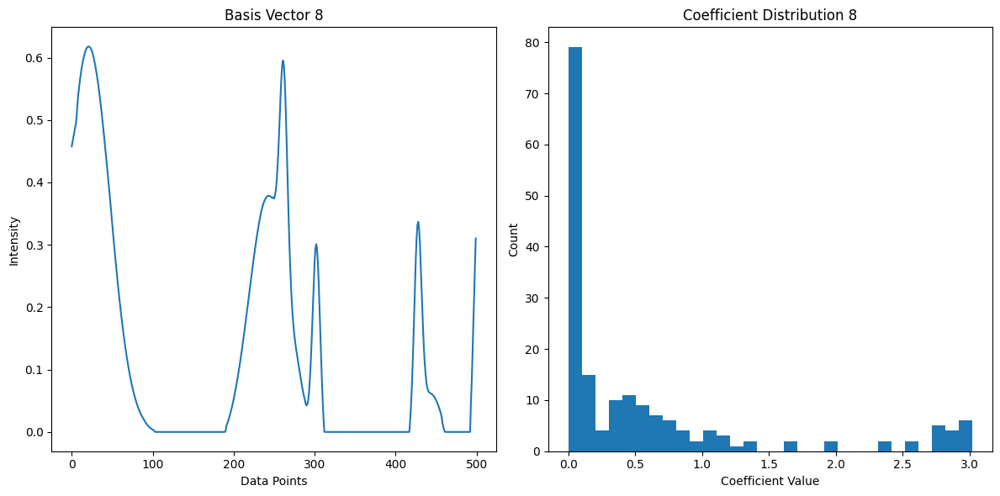


Component 8 characteristics:
Max intensity: 0.618
Mean coefficient: 0.578
Coefficient variance: 0.747
Label: 1
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: 2
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 2
Label: 3
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: 4
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 1
Label: 5
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: 6
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: 7
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0
Label: 8
Basis shape: (500,)
Coefficients shape: (180,)
Cluster: 0


In [10]:
# Example usage
data = np.array(rotated_data)  # Your input data
max_components = 8
n_clusters = 3

# Run the modified workflow
labeled_components, clusters = run_sklearn_nmf_with_labeling(
    data=data,
    max_components=max_components,
    n_clusters=n_clusters
)

# Access labeled components
for label, component in labeled_components.items():
    print(f"Label: {label}")
    print(f"Basis shape: {component['basis'].shape}")
    print(f"Coefficients shape: {component['coefficients'].shape}")
    print(f"Cluster: {component['cluster']}")

Starting NMF algorithm with the following parameters:

Max components: 2
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: random, solver: mu, tol: 0.0001
Run with 1 components has been completed
Run with 2 components has been completed


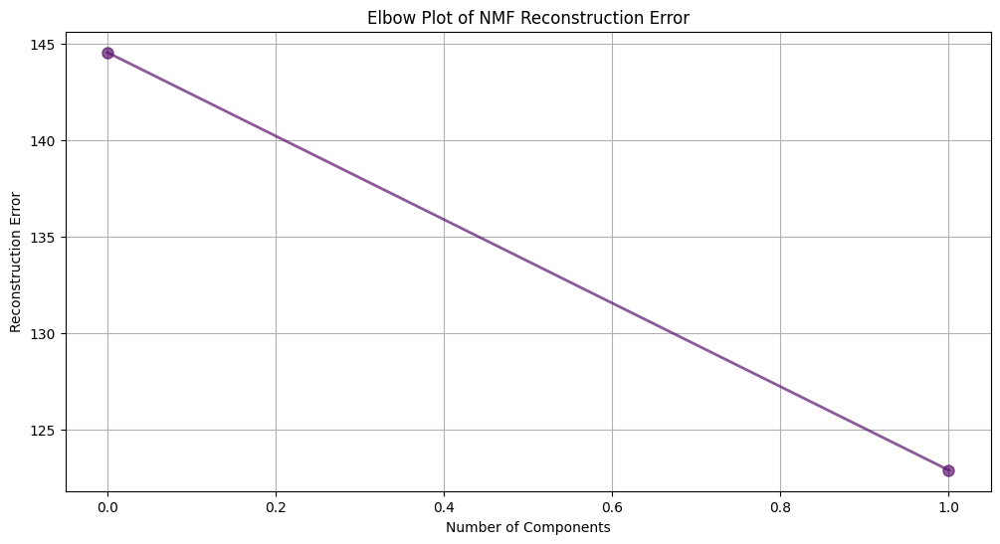

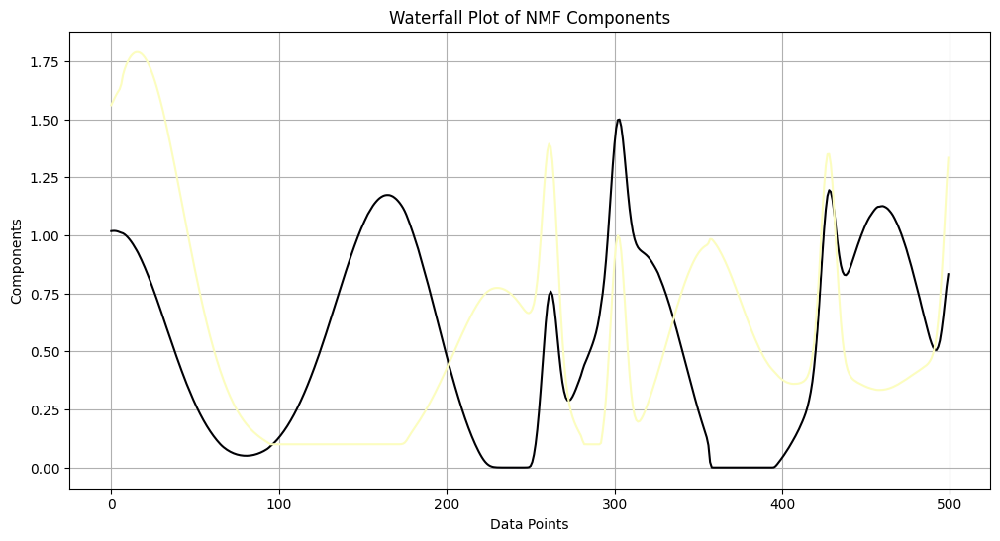

The best number of components is 2
Starting NMF algorithm with the following parameters:

Max components: 3
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvdar, solver: cd, tol: 1e-05
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed


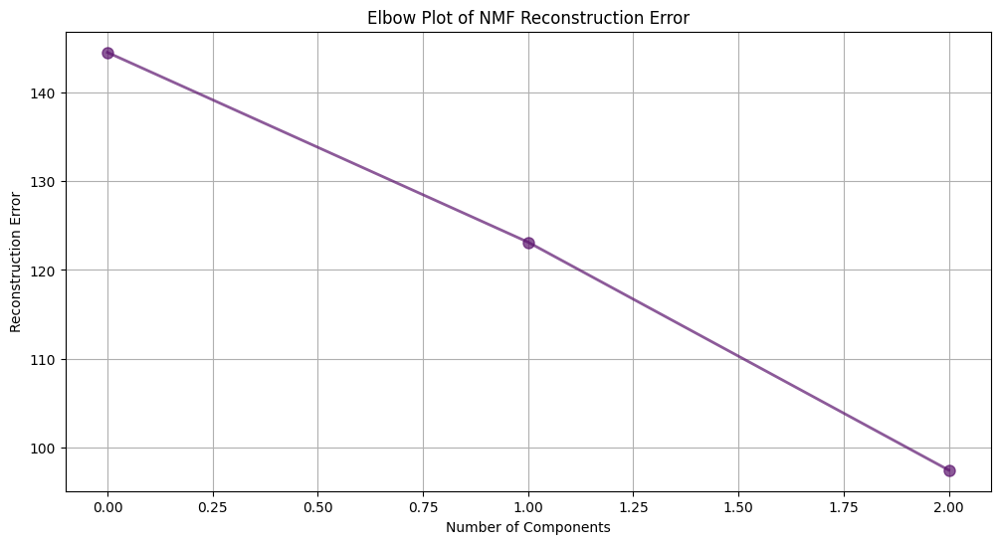

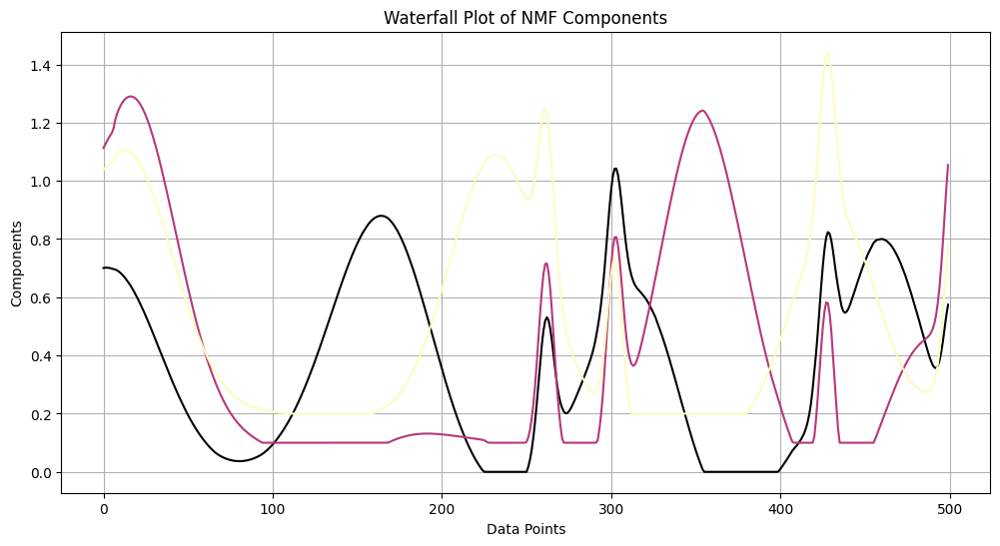

The best number of components is 3
Starting NMF algorithm with the following parameters:

Max components: 4
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvda, solver: cd, tol: 1e-05
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed


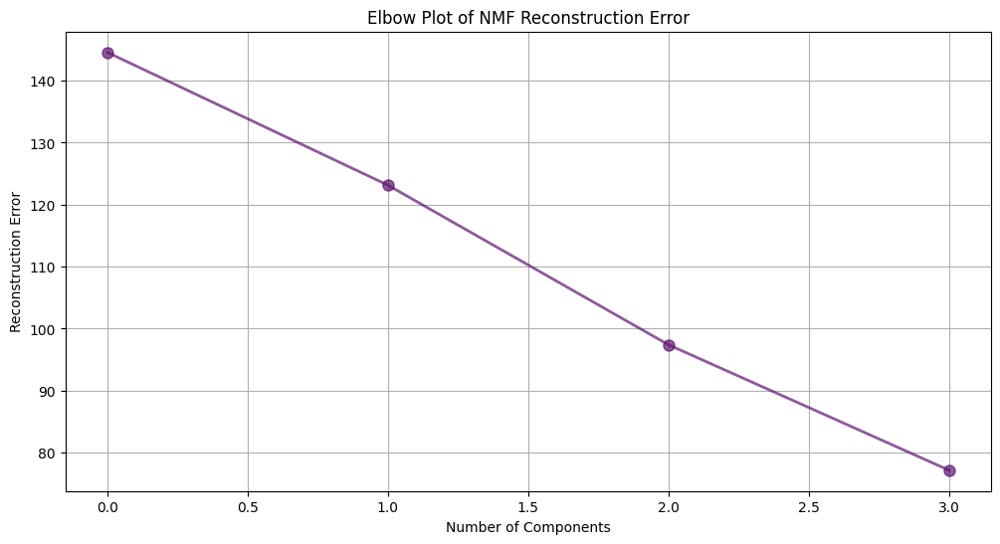

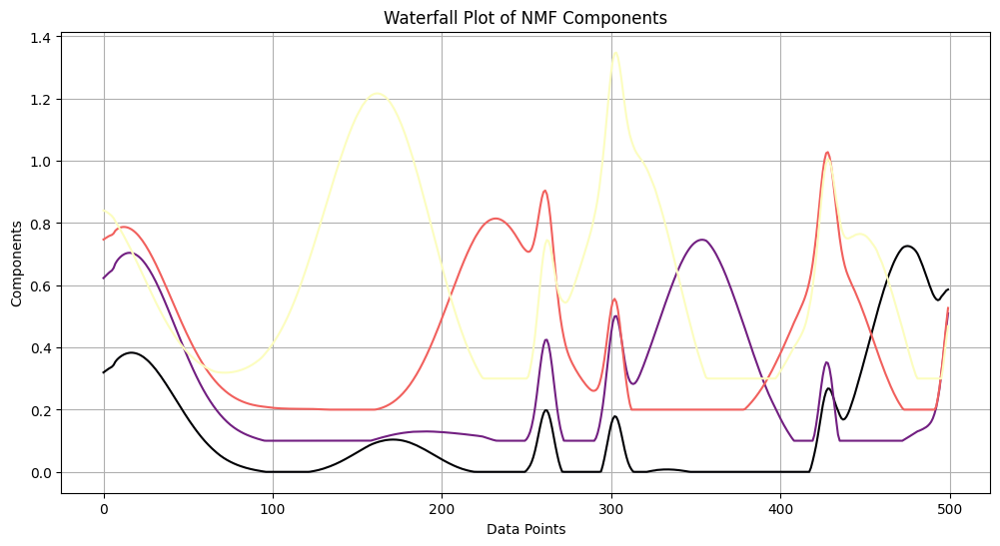

The best number of components is 4
Starting NMF algorithm with the following parameters:

Max components: 5
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: random, solver: cd, tol: 1e-05
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed


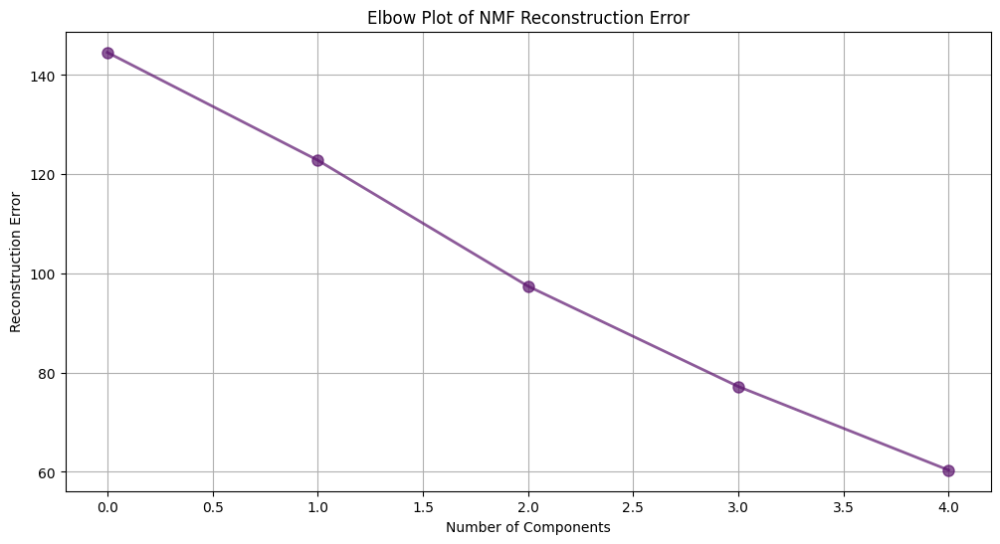

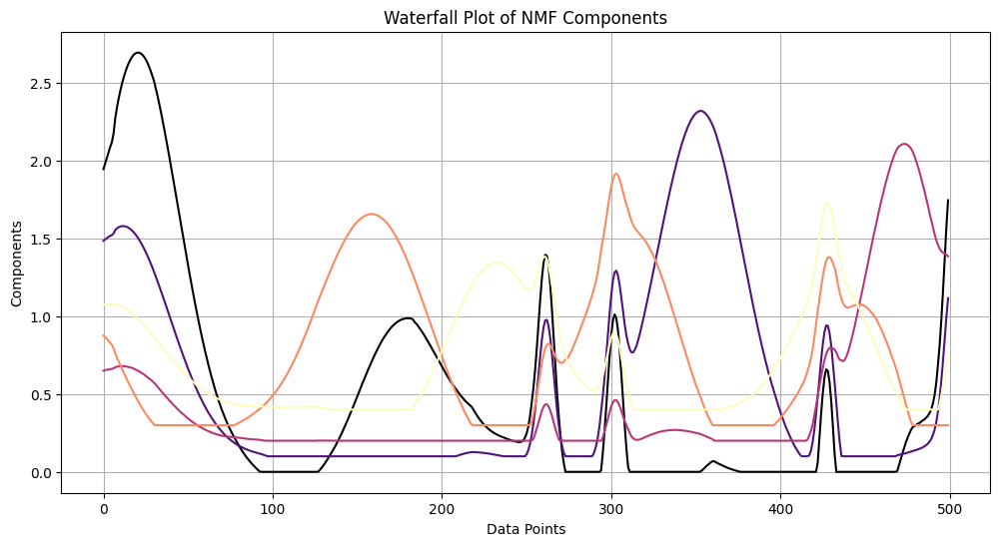

The best number of components is 5
Starting NMF algorithm with the following parameters:

Max components: 6
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: random, solver: cd, tol: 0.0001
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed


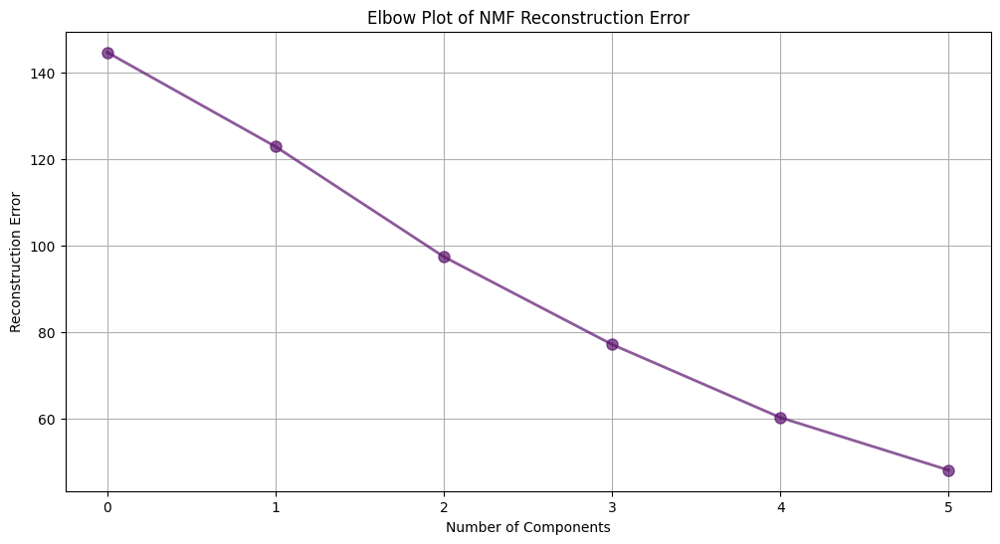

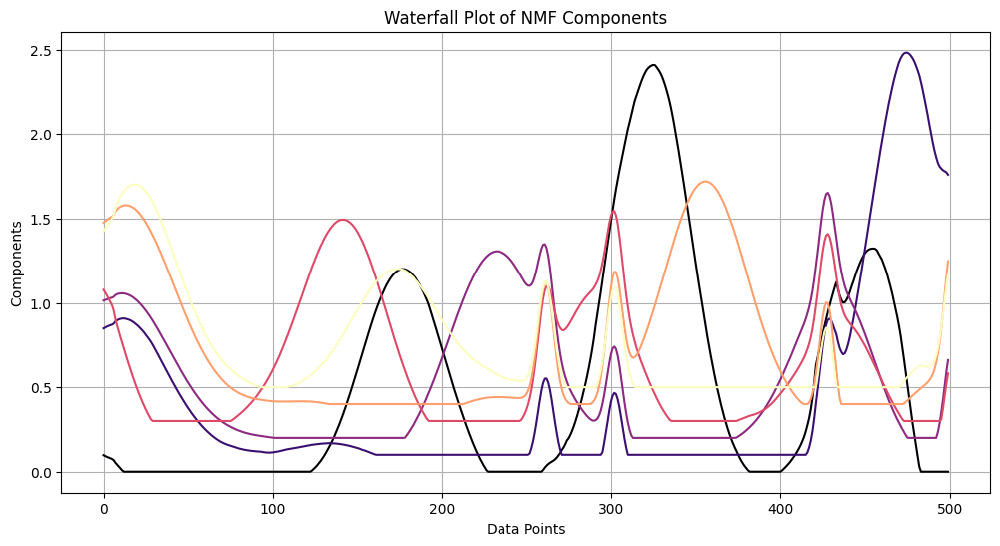

The best number of components is 6
Starting NMF algorithm with the following parameters:

Max components: 7
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: random, solver: cd, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed


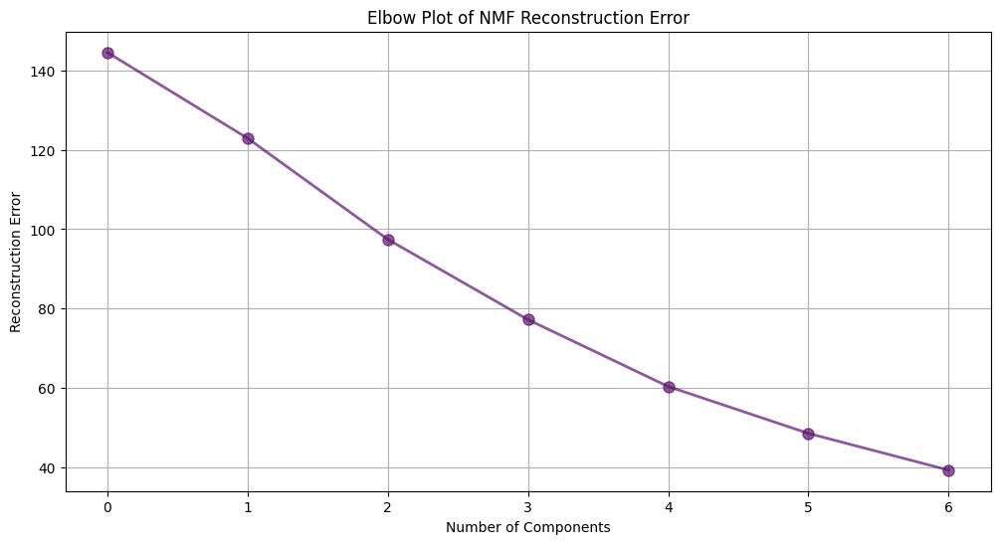

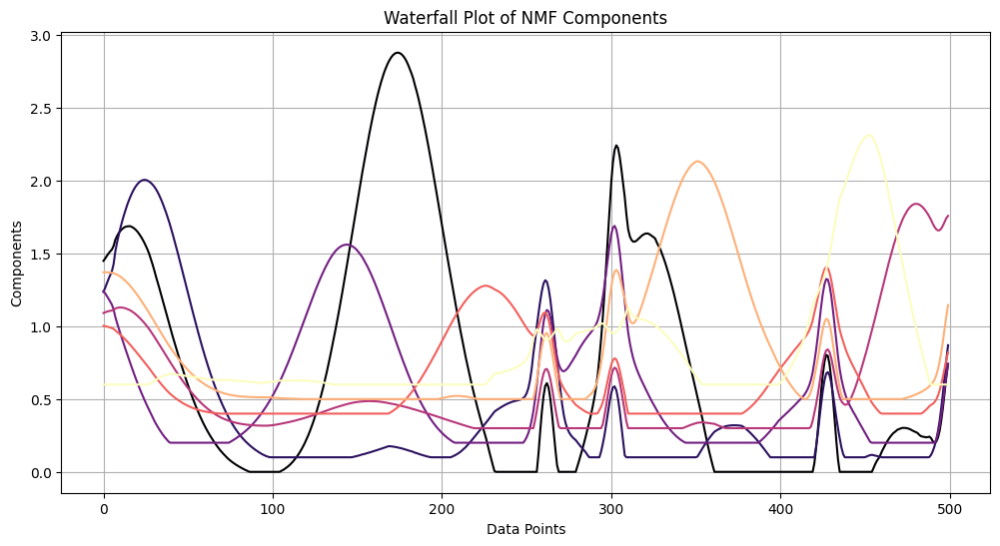

The best number of components is 7
Starting NMF algorithm with the following parameters:

Max components: 8
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvda, solver: mu, tol: 1e-05
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed


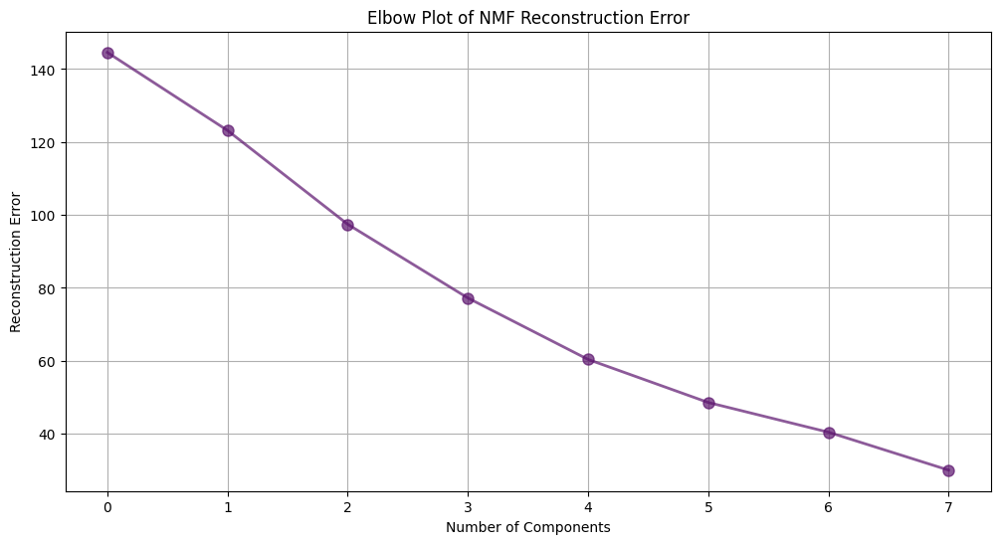

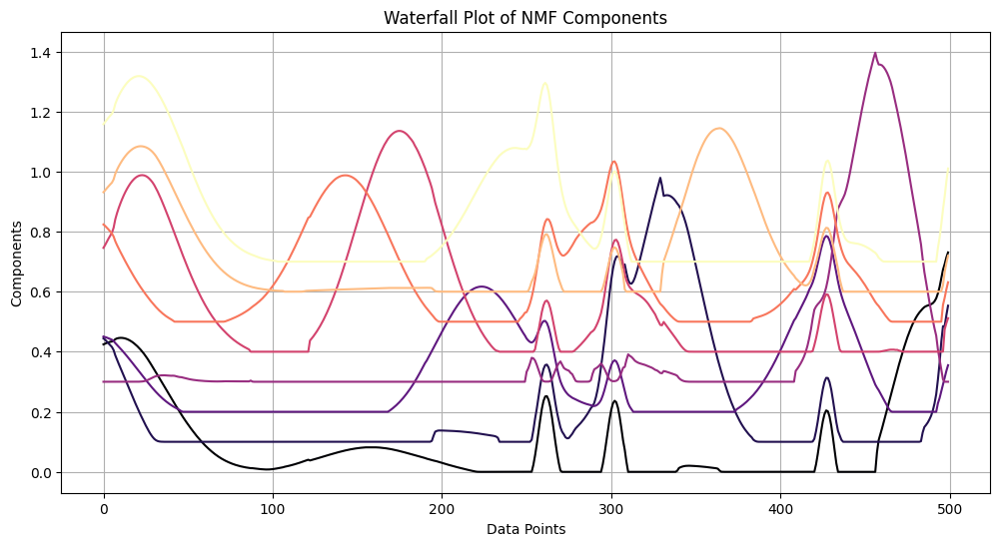

The best number of components is 8
Starting NMF algorithm with the following parameters:

Max components: 9
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvdar, solver: cd, tol: 0.0001
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed


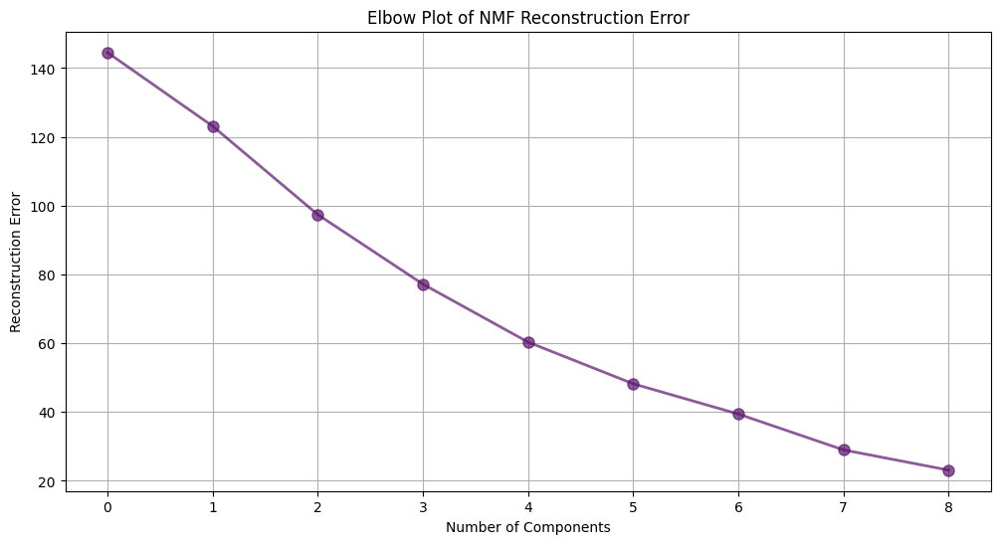

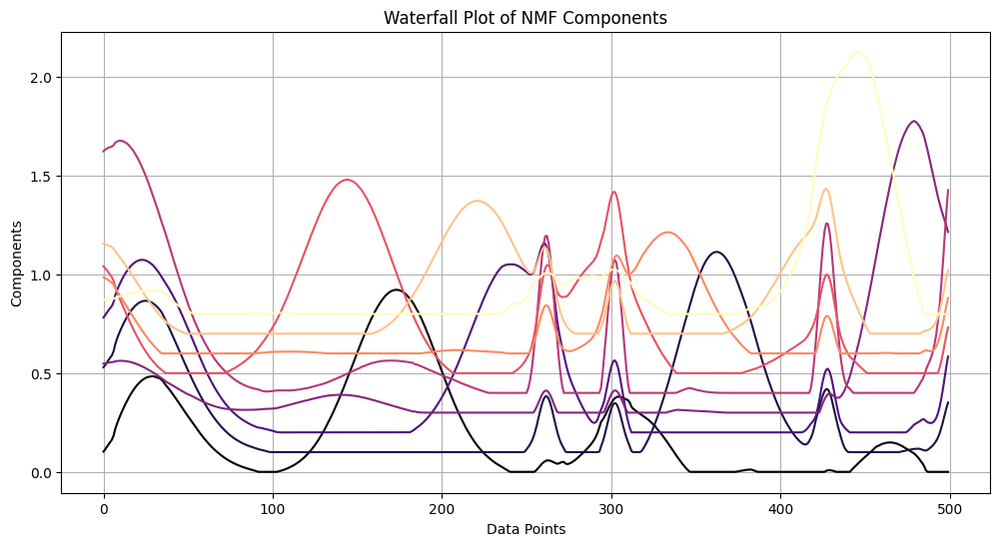

The best number of components is 9
Starting NMF algorithm with the following parameters:

Max components: 10
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvdar, solver: cd, tol: 0.0001
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed


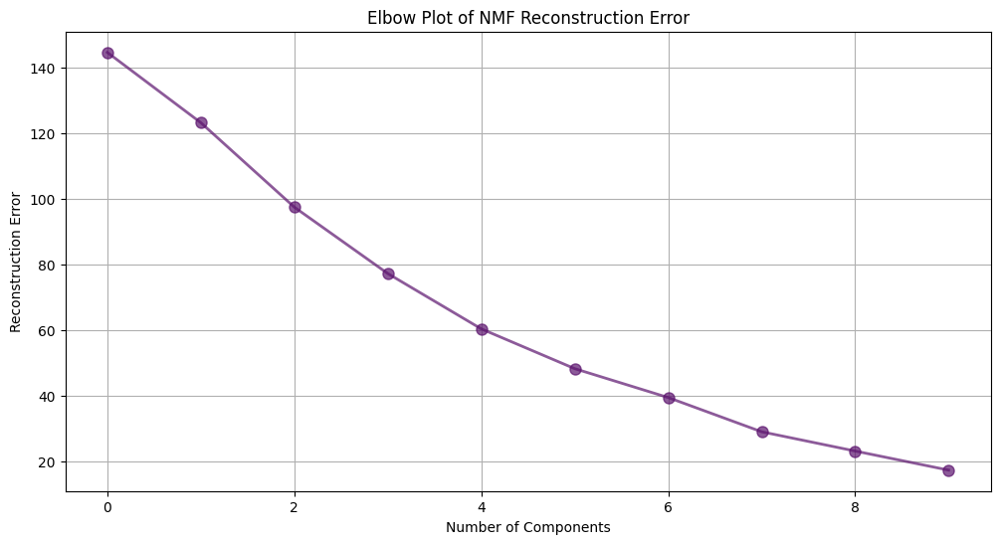

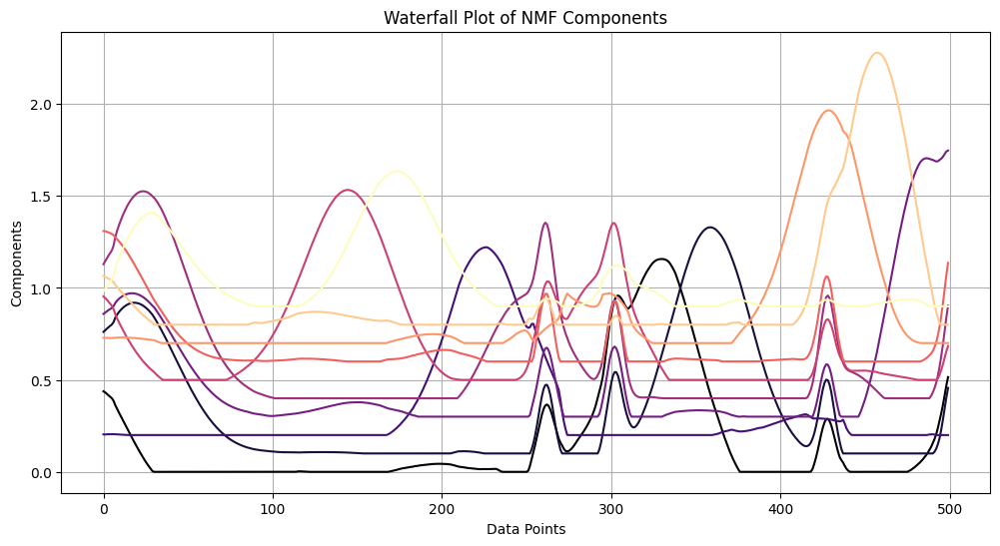

The best number of components is 10
Starting NMF algorithm with the following parameters:

Max components: 11
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvd, solver: cd, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed
Run with 11 components has been completed


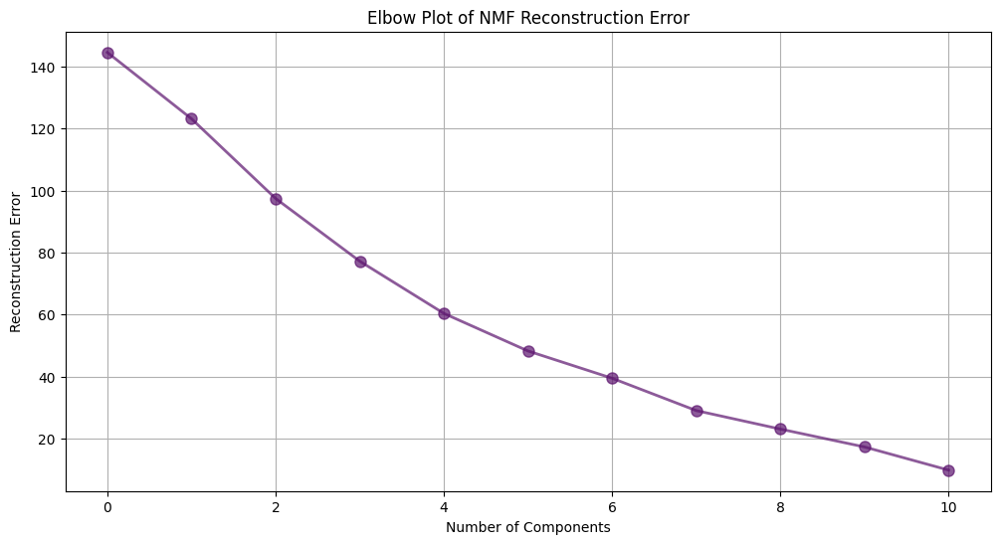

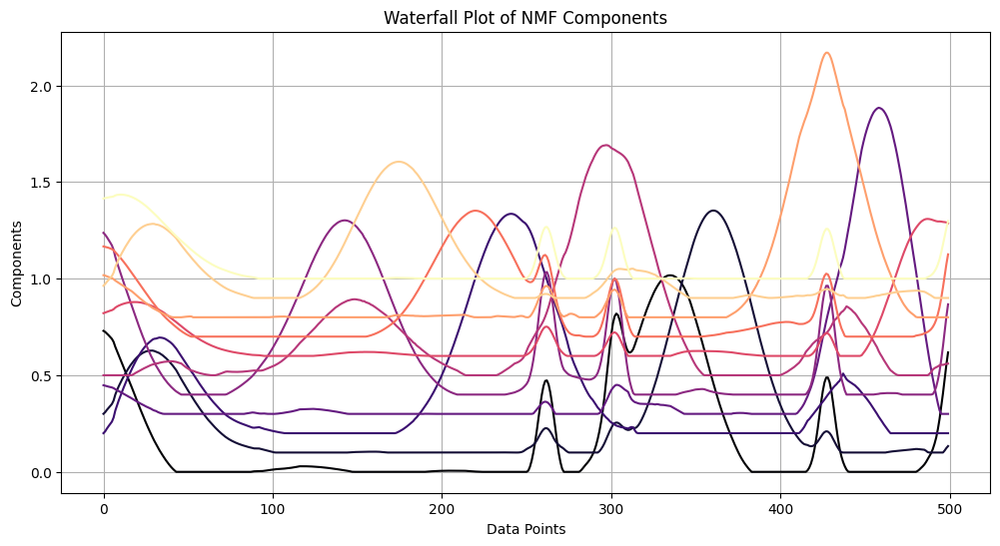

The best number of components is 11
Starting NMF algorithm with the following parameters:

Max components: 12
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvd, solver: mu, tol: 1e-05
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed
Run with 11 components has been completed
Run with 12 components has been completed


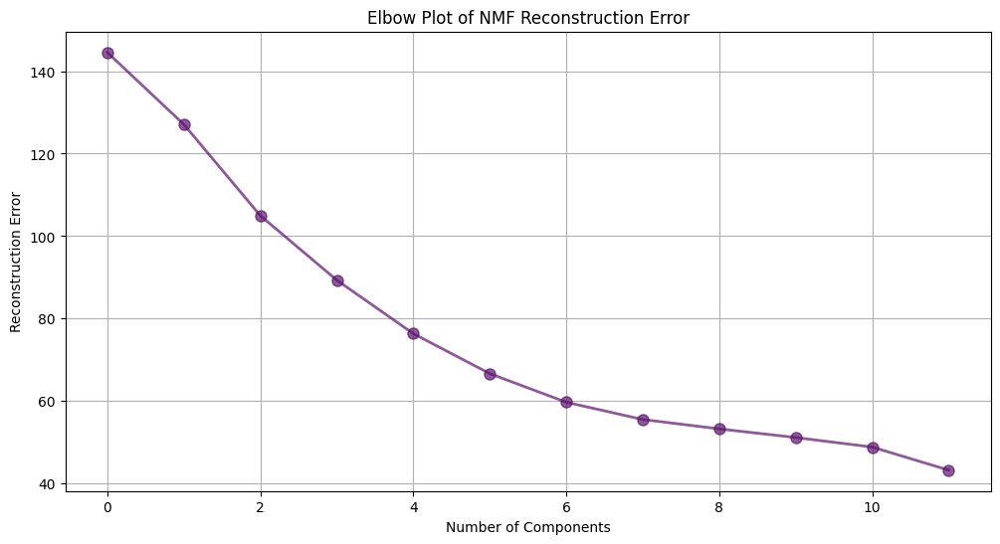

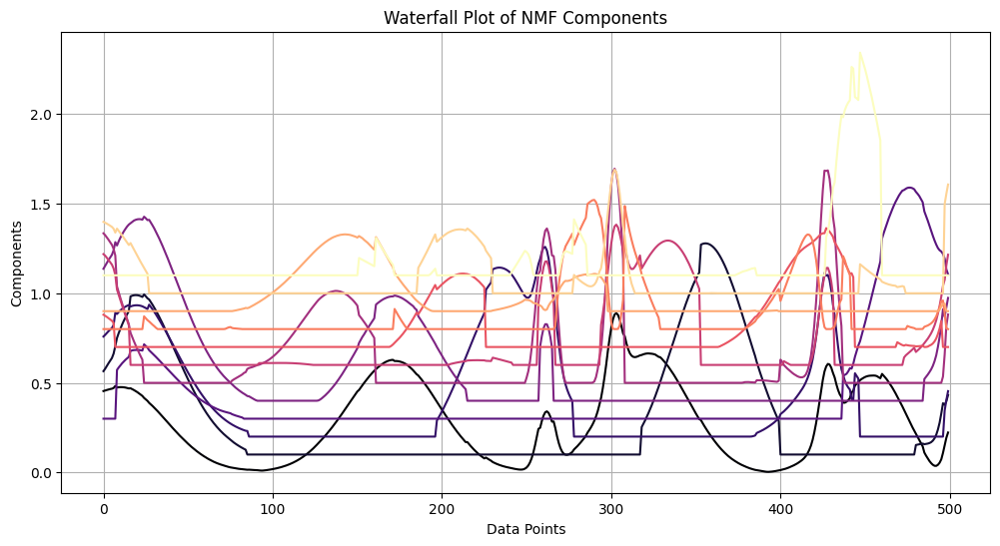

The best number of components is 12
Starting NMF algorithm with the following parameters:

Max components: 13
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvd, solver: mu, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed
Run with 11 components has been completed
Run with 12 components has been completed
Run with 13 components has been completed


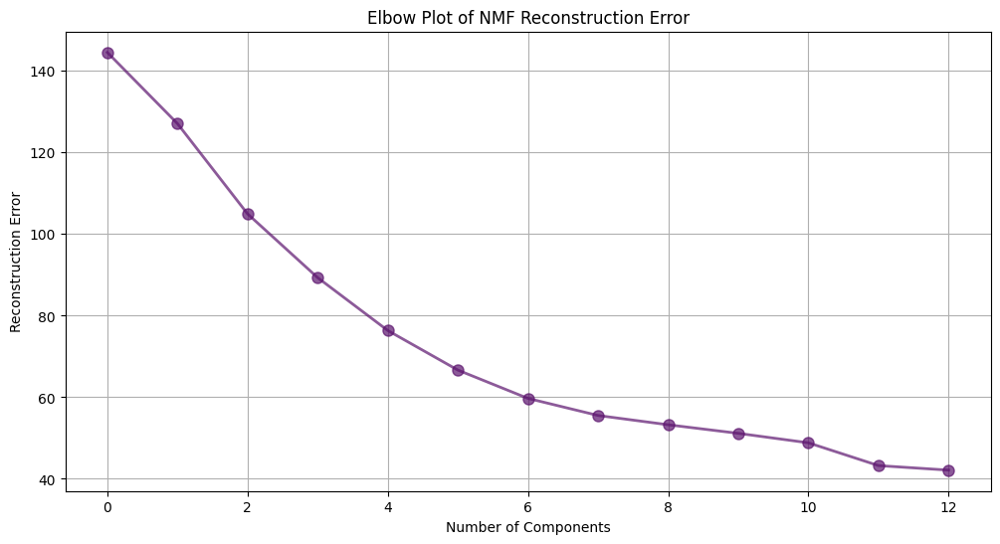

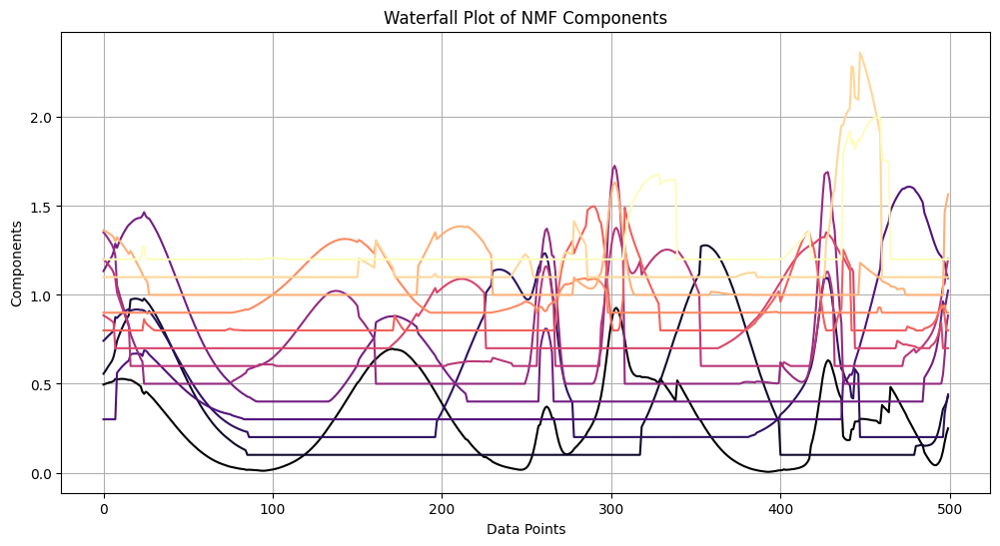

The best number of components is 13
Starting NMF algorithm with the following parameters:

Max components: 14
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: nndsvd, solver: cd, tol: 1e-06
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed
Run with 11 components has been completed
Run with 12 components has been completed
Run with 13 components has been completed
Run with 14 components has been completed


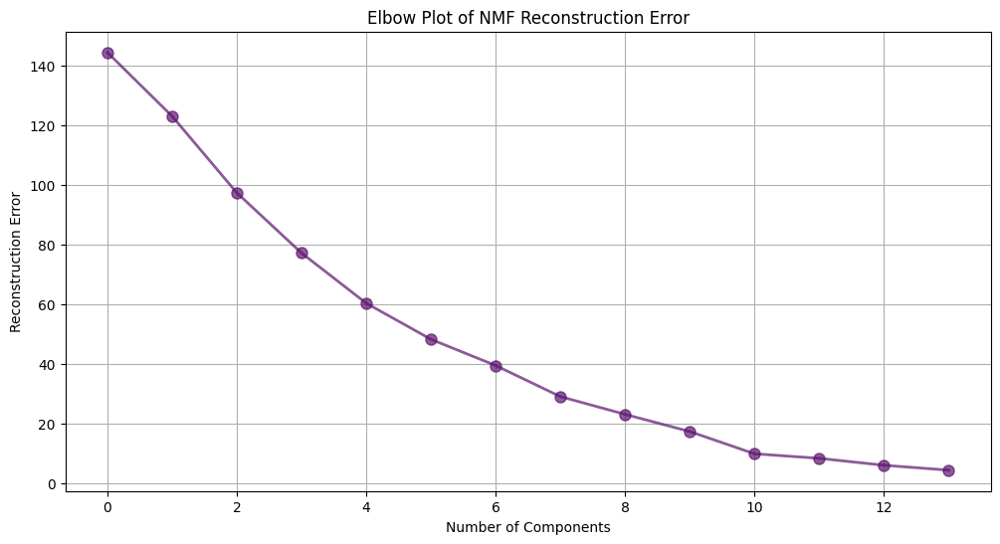

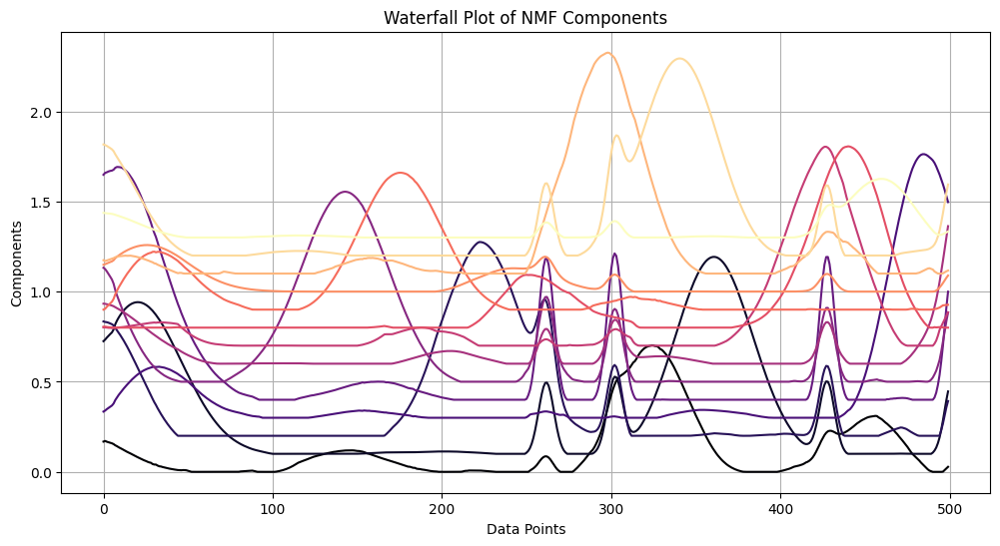

The best number of components is 14


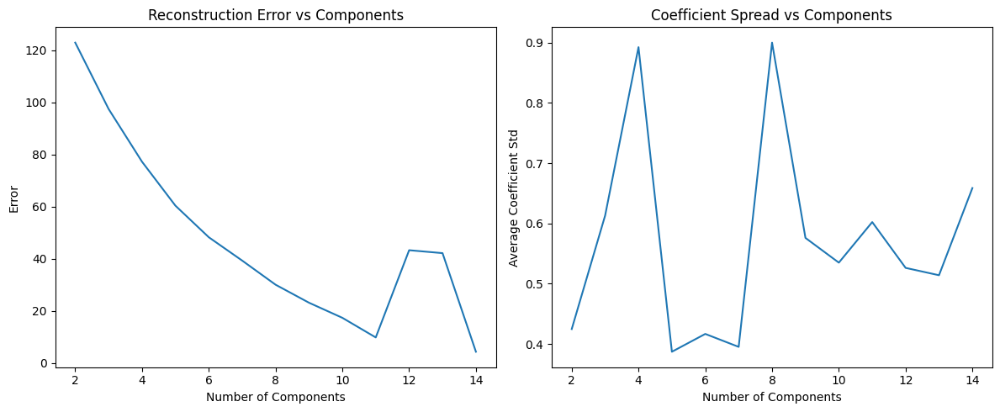

In [11]:
def test_component_numbers(data, max_range=15):
    reconstruction_errors = []
    coefficient_spreads = []
    
    for n in range(2, max_range):
        # Run NMF with different numbers of components
        W, H, err = iso.run_sklearn_nmf(data, n)
        reconstruction_errors.append(err)
        
        # Calculate how spread out the coefficients are
        coef_spread = np.mean([np.std(h) for h in H])
        coefficient_spreads.append(coef_spread)
        
    # Plot results
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(2, max_range), reconstruction_errors)
    plt.title('Reconstruction Error vs Components')
    plt.xlabel('Number of Components')
    plt.ylabel('Error')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(2, max_range), coefficient_spreads)
    plt.title('Coefficient Spread vs Components')
    plt.xlabel('Number of Components')
    plt.ylabel('Average Coefficient Std')
    
    plt.tight_layout()
    plt.show()

test_component_numbers(rotated_data)


In [12]:
def try_different_clustering(labeled_components, n_clusters=3):
    basis_matrix = np.column_stack([comp['basis'] for comp in labeled_components.values()])
    clustering = iso.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    clusters = clustering.fit_predict(basis_matrix.T)
    return clusters

cluster_try = try_different_clustering(labeled_components, n_clusters=3)


Starting NMF algorithm with the following parameters:

Max components: 10
Max iterations: 600
Init: random
Solver: cd
Tolerance: 0.0001
Patience: 5
Random
Random initializers completed
Continuing with best run parameters that are init: random, solver: mu, tol: 0.0001
Run with 1 components has been completed
Run with 2 components has been completed
Run with 3 components has been completed
Run with 4 components has been completed
Run with 5 components has been completed
Run with 6 components has been completed
Run with 7 components has been completed
Run with 8 components has been completed
Run with 9 components has been completed
Run with 10 components has been completed


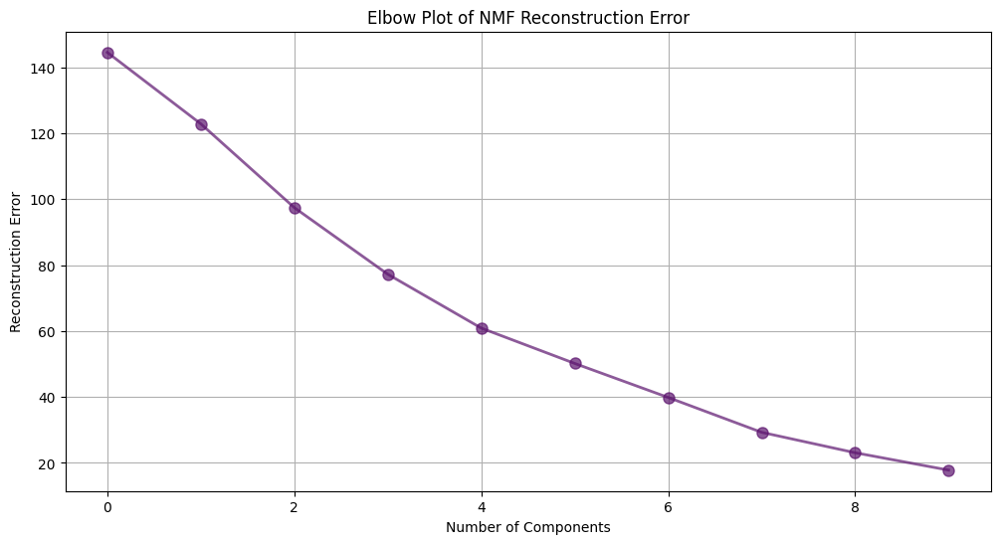

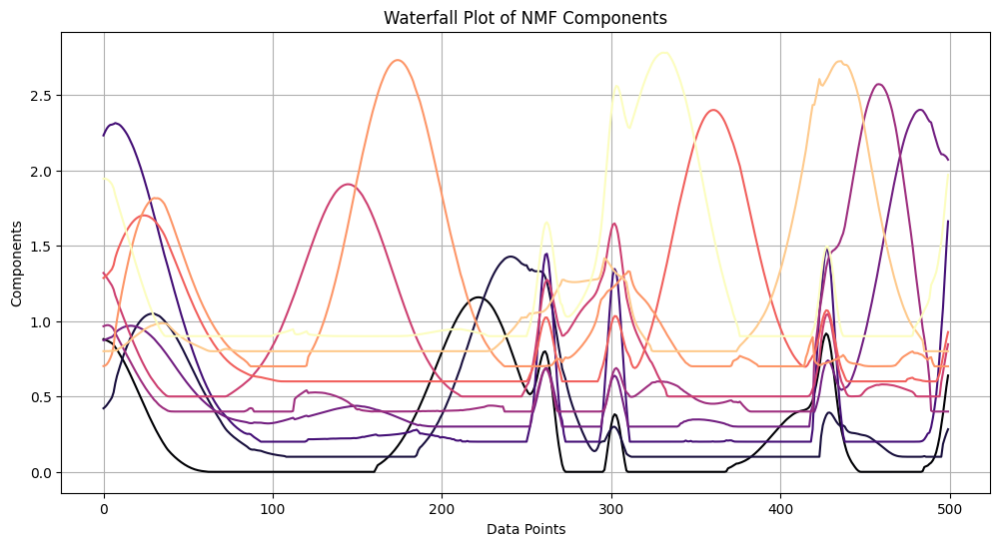

The best number of components is 10
Data range: 0.0004275227 3.5012195


TypeError: run_sklearn_nmf() missing 1 required positional argument: 'max_components'

In [13]:
# Common scenarios leading to this:
# 1. Too many components requested:
W, H, err = iso.run_sklearn_nmf(rotated_data, max_components=10)  # Try reducing this

# 2. Data scaling issues:
# Check your data range
print("Data range:", np.min(rotated_data), np.max(rotated_data))

# 3. Poor initialization:
# Try different initialization methods
W, H, err = iso.run_sklearn_nmf(rotated_data, init='nndsvdar')  # Instead of 'random'